# 1. Chargement du fichier

> Création du dataFrame **data_df** à partir du fichier **P6_01_fichier.csv** contenant les commentaires
et les photos de 200 restaurants de Paris.

In [1]:
import numpy as np
import pandas as pd
from pandas import DataFrame
from matplotlib import pyplot as plt
from sklearn import linear_model
from sklearn import decomposition
from sklearn import preprocessing
from ipywidgets import interact
from ipywidgets import interactive
from IPython.display import display
import plotly.graph_objects as go
from sklearn import metrics
from sklearn.neighbors import NearestNeighbors
import ipywidgets as widgets
import seaborn as sns
import missingno as msno
import plotly.express as px
import warnings
import re
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import NMF
import nltk
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.stem.snowball import FrenchStemmer
#nltk.download('stopwords')

warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

sns.set()

missing_values = ["na", "n/a", "--", " "]
data_df = pd.read_csv("P6_01_fichier.csv",
                      sep=',', na_values=missing_values,
                      low_memory=False)
data_df1 = pd.read_csv("P6_01_fichier_rating.csv",
                      sep=',', na_values=missing_values,
                      low_memory=False)

## a) Affichage des lignes en début de fichier

In [2]:
data_df.head()

,id,name,text_review,photo_1,photo_2,photo_3
0,-0iLH7iQNYtoURciDpJf6w,Le Comptoir de la Gastronomie,Une adresse immanquable. \nLe meilleur magret...,https://s3-media2.fl.yelpcdn.com/bphoto/Je6THJ...,https://s3-media2.fl.yelpcdn.com/bphoto/Y0D70M...,https://s3-media4.fl.yelpcdn.com/bphoto/HetBW7...
1,IU9_wVOGBKjfqTTpAXpKcQ,Bistro des Augustins,Voilà un bar qu on aime voir à Paris !\nL acc...,https://s3-media1.fl.yelpcdn.com/bphoto/hPCZTb...,https://s3-media4.fl.yelpcdn.com/bphoto/Y5fZV7...,https://s3-media2.fl.yelpcdn.com/bphoto/mYdGVn...
2,FFz-WusZrBYZexKqhqzCkg,L'As du Fallafel,"Rien a ajouter, ils sont toujours parfaits le...",https://s3-media3.fl.yelpcdn.com/bphoto/QMNELS...,https://s3-media1.fl.yelpcdn.com/bphoto/xtLO-X...,https://s3-media4.fl.yelpcdn.com/bphoto/xIxo5a...
3,cEjF41ZQB8-SST8cd3EsEw,L'Avant Comptoir,"Nous sommes complètement déstabilisé, possibl...",https://s3-media3.fl.yelpcdn.com/bphoto/mVwgxg...,https://s3-media3.fl.yelpcdn.com/bphoto/XA5QGI...,https://s3-media2.fl.yelpcdn.com/bphoto/azxglN...
4,26Ts-2XRSeqiweSwLuyv6Q,Grenouilles,Nous quittons à regret cette très sympathique...,https://s3-media4.fl.yelpcdn.com/bphoto/fgVrLC...,https://s3-media3.fl.yelpcdn.com/bphoto/dyUbhh...,https://s3-media1.fl.yelpcdn.com/bphoto/pJOb8D...


In [3]:
data_df1.head()

,id,name,text_review,rating
0,-0iLH7iQNYtoURciDpJf6w,Le Comptoir de la Gastronomie,Une adresse immanquable. \nLe meilleur magret ...,5
1,-0iLH7iQNYtoURciDpJf6w,Le Comptoir de la Gastronomie,"Très bon, le prix abordable et le restaurant e...",4
2,-0iLH7iQNYtoURciDpJf6w,Le Comptoir de la Gastronomie,Très bon accueil \nTrès bonne cuisine,5
3,IU9_wVOGBKjfqTTpAXpKcQ,Bistro des Augustins,Voilà un bar qu on aime voir à Paris !\nL accu...,5
4,IU9_wVOGBKjfqTTpAXpKcQ,Bistro des Augustins,Super resto juste au bord de la Seine avec Not...,5


## b) Affichage des colonnes et lignes, ansi que leurs nombres


In [4]:
print('Nombre de restaurants dans le fichier   : ', data_df.shape[0])
print('Nombre de colonnes du fichier           : ', data_df.shape[1])

Nombre de restaurants dans le fichier   :  230
Nombre de colonnes du fichier           :  6


* Fichier des scores des commentaires :

In [5]:
print('Nombre de restaurants dans le fichier des scores : ', data_df1.shape[0])
print('Nombre de colonnes du fichier                    : ', data_df1.shape[1])

Nombre de restaurants dans le fichier des scores :  644
Nombre de colonnes du fichier                    :  4


## c) Affichage du nombre de valeurs manquantes pour chaque colonne


In [6]:
nb_col_nan = data_df.isnull().sum()
nb_col_nan

id             0
name           0
text_review    0
photo_1        0
photo_2        0
photo_3        0
dtype: int64

* Fichier des scores des commentaires :

In [7]:
nb_col_nan = data_df1.isnull().sum()
nb_col_nan

id             0
name           0
text_review    0
rating         0
dtype: int64

> On peut définir le pourcentage de données manquantes dans notre dataset :

In [8]:
nb_tot_cells_df = np.product(data_df.shape)
nb_tot_cells_manq = nb_col_nan.sum()

pct = (nb_tot_cells_manq / nb_tot_cells_df) * 100
print('Pourcentage de cellules manquantes   : ', pct)

Pourcentage de cellules manquantes   :  0.0


* On va définir deux dataframes à partir du **data_df1** et selon des critères de rating des commentaires (avis positifs >= 3, avis négatif < 3) :

In [9]:
data_df_pos = data_df1.query('rating >= 3')
data_df_neg = data_df1.query('rating < 3')
data_df_pos.head()

,id,name,text_review,rating
0,-0iLH7iQNYtoURciDpJf6w,Le Comptoir de la Gastronomie,Une adresse immanquable. \nLe meilleur magret ...,5
1,-0iLH7iQNYtoURciDpJf6w,Le Comptoir de la Gastronomie,"Très bon, le prix abordable et le restaurant e...",4
2,-0iLH7iQNYtoURciDpJf6w,Le Comptoir de la Gastronomie,Très bon accueil \nTrès bonne cuisine,5
3,IU9_wVOGBKjfqTTpAXpKcQ,Bistro des Augustins,Voilà un bar qu on aime voir à Paris !\nL accu...,5
4,IU9_wVOGBKjfqTTpAXpKcQ,Bistro des Augustins,Super resto juste au bord de la Seine avec Not...,5


In [10]:
data_df_neg.head()

,id,name,text_review,rating
17,ijqSzadlZ9SCXvUEpMimcA,Angelina,"Une étoile pour le magnifique cadre, les petit...",1
21,KggnM_Z4wOa_JExunaaWHg,Le Temps des Cerises,"Un gros ""Mouais""\nAttiré par les bons commenta...",2
30,flf_IHitjG7bohr-VbOvbA,Le Petit Canard,Le repas était convenable mais le rapport qual...,2
42,4TZ92lo35VPqjrAvOVkQmQ,The Family,"Repas ok. Prix ok, accueil ok mais, mais, mais...",1
47,xEg_qiHxlud17zHXrTrFSQ,Ferdi,"Pour commencer, le cadre est sympathique mais ...",1


# 2. Analyse des commentaires des restaurants


> Dans cette partie, on va analyser les différents sujets abordés dans les commentaires et mettre en evidence les sujets d'insatisfaction.

## a) Pré-traitement des données textuelles

> Les mots des textes sont nettoyés avec la conversion des majuscules en minuscules, la suppression de la ponctuation et des caractères spéciaux, la suppression des **stopwords**. Des transformations telles que la **tokenisation, le stemming et la lemmatisation** vont être appliquées.

### Traitement du corpus contenant des commentaires avec différents ratings

* Chargement et suppression des espaces dans les commentaires :

In [11]:
reviews_pos = []
reviews_neg = []
reviews = []
reviews_df = []
rating  = []

for i in data_df1.index:
    reviews.append(data_df1["text_review"][i].strip())
    rating.append(data_df1["rating"][i])


for i in data_df_pos.index:
    reviews_pos.append(data_df_pos["text_review"][i].strip())
    

for i in data_df_neg.index:
    reviews_neg.append(data_df_neg["text_review"][i].strip())


for i in data_df.index:
    reviews_df.append(data_df["text_review"][i].strip())

* Nettoyage des textes avec conversion en minuscules et suppression des nombres :

In [12]:
REPLACE_NO_SPACE = re.compile("[.;:!\?,\"()\[\]]")
REPLACE_WITH_SPACE = re.compile("(<br\s*/><br\s*/>)|(\-)|(\/)|(\n)|(')|[0-9]")

def preprocess_reviews(reviews):
    reviews = [REPLACE_NO_SPACE.sub("", line.lower()) for line in reviews]
    reviews = [REPLACE_WITH_SPACE.sub(" ", line) for line in reviews]
    
    return reviews

reviews_clean = preprocess_reviews(reviews)
reviews_clean_pos = preprocess_reviews(reviews_pos)
reviews_clean_neg = preprocess_reviews(reviews_neg)
reviews_clean_df = preprocess_reviews(reviews_df)

* Elimination des stopwords français, ce qui ne change pas la sémantique des phrases :

In [13]:
stop_words_fr = stopwords.words('french')
stop_words_ot = ['et', 'dans', 'un', 'une', 'des', 'à', 'le', 'la',
                 'les', 'de', 'au', 'chez', 'j ', 'tu', 'il',
                 'elle', 'on', 'nous', 'vous', 'ils', 'elles']


def remove_stop_words(corpus, stop_words):
    removed_stop_words = []
    for review in corpus:
        removed_stop_words.append(
            ' '.join([word for word in review.split() 
                      if word not in stop_words])
        )
    return removed_stop_words

reviews_clean = remove_stop_words(reviews_clean, stop_words_fr)
reviews_clean = remove_stop_words(reviews_clean, stop_words_ot)
reviews_clean_pos = remove_stop_words(reviews_clean_pos, stop_words_fr)
reviews_clean_pos = remove_stop_words(reviews_clean_pos, stop_words_ot)
reviews_clean_neg = remove_stop_words(reviews_clean_neg, stop_words_fr)
reviews_clean_neg = remove_stop_words(reviews_clean_neg, stop_words_ot)
reviews_clean_df = remove_stop_words(reviews_clean_df, stop_words_fr)
reviews_clean_df = remove_stop_words(reviews_clean_df, stop_words_ot)

* Normalisation par **le stemming** (récupération de la racine du mot --> suppression des suffixes et préfixes) et **la lemmatisation** (récupération du sens du mot --> infinitif, nom masculin singuler).

In [14]:
def get_stemmed_text(corpus):
    stemmer = FrenchStemmer()
    return [' '.join([stemmer.stem(word) for word in review.split()])\
            for review in corpus]

stemmed_reviews = get_stemmed_text(reviews_clean)
stemmed_reviews_pos = get_stemmed_text(reviews_clean_pos)
stemmed_reviews_neg = get_stemmed_text(reviews_clean_neg)
stemmed_reviews_df = get_stemmed_text(reviews_clean_df)

* Lemmatisation avec **Spacy** :

In [15]:
import spacy
nlp = spacy.load('fr_core_news_md')



def get_lemmatized_text(corpus):
    lem = [' '.join([token.lemma_ for token in nlp(review)]) for review in corpus]
    return lem


reviews_clean = get_lemmatized_text(reviews_clean)
reviews_clean_pos = get_lemmatized_text(reviews_clean_pos)
reviews_clean_neg = get_lemmatized_text(reviews_clean_neg)
reviews_clean_df = get_lemmatized_text(reviews_clean_df)

* Tokenisation afin de montrer le nombre de mots uniques des commentaires de différents restaurants et visualisation :

In [16]:
tokenizer = nltk.RegexpTokenizer(r'\w+')

nb_mots_review = []
for elt in reviews_clean_df:
    nb_mots_review.append(len(tokenizer.tokenize(elt)))

data_df['nb_words'] = nb_mots_review
data_df.sort_values(by='nb_words', ascending=False,
                    inplace=True)
data_df.head()

,id,name,text_review,photo_1,photo_2,photo_3,nb_words
124,pztzge22A_c_BfzLHCmaMw,Le Bistro du Périgord,This was one of my top places to eat. Ordered...,https://s3-media4.fl.yelpcdn.com/bphoto/rOSDuj...,https://s3-media4.fl.yelpcdn.com/bphoto/fx9KZY...,https://s3-media1.fl.yelpcdn.com/bphoto/HlcoYN...,64
2,FFz-WusZrBYZexKqhqzCkg,L'As du Fallafel,"Rien a ajouter, ils sont toujours parfaits le...",https://s3-media3.fl.yelpcdn.com/bphoto/QMNELS...,https://s3-media1.fl.yelpcdn.com/bphoto/xtLO-X...,https://s3-media4.fl.yelpcdn.com/bphoto/xIxo5a...,55
208,Hxqo84j1PWvo0-HizpHsuA,L'îlot,Trouver un bon spot où manger des plateaux de...,https://s3-media2.fl.yelpcdn.com/bphoto/B7JaBq...,https://s3-media2.fl.yelpcdn.com/bphoto/bSDHm2...,https://s3-media2.fl.yelpcdn.com/bphoto/BAGVuE...,54
88,snXC-mZkOxsFhgLhFYbtGg,La Fresque,Trouver un bon restaurant autour des halles s...,https://s3-media1.fl.yelpcdn.com/bphoto/KLzbBU...,https://s3-media4.fl.yelpcdn.com/bphoto/kAbreX...,https://s3-media4.fl.yelpcdn.com/bphoto/Qj4UKP...,54
50,WqXhQg1Nhv4pffAHp-3JyA,Ô Chateau,Très bonne adresse pour les plus fortunés d'e...,https://s3-media3.fl.yelpcdn.com/bphoto/c_4S-c...,https://s3-media4.fl.yelpcdn.com/bphoto/HTdGVZ...,https://s3-media3.fl.yelpcdn.com/bphoto/nyb_US...,54


Text(Kunitoraya - Bistro Udon, 52.2, '54')

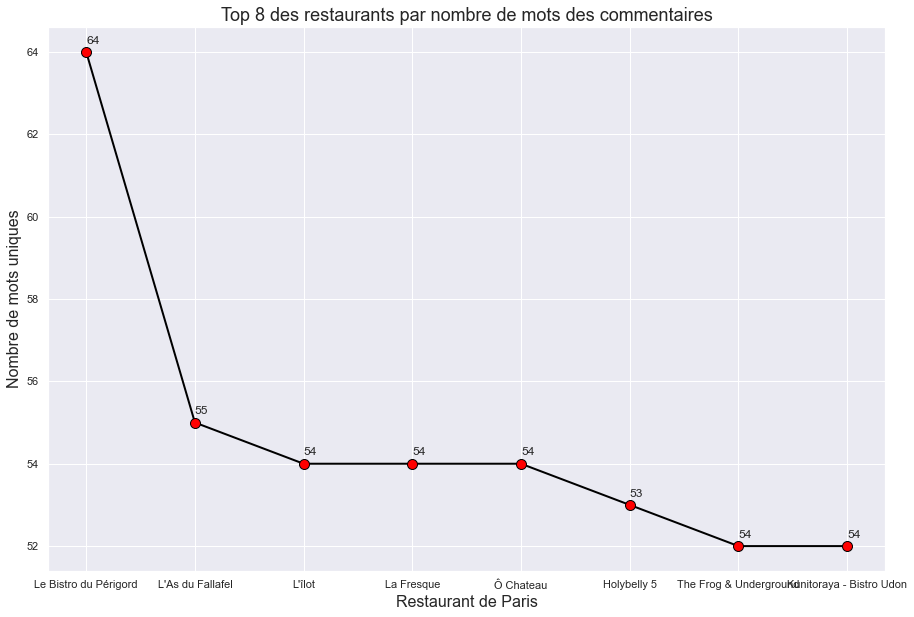

In [19]:
plt.figure(figsize=(15, 10))
name = data_df["name"].values.tolist()
nb_words = data_df["nb_words"].values.tolist()
nb_words_1 = []
name_1 = []

for i, elt in enumerate(nb_words):
    if elt >= 52:
        nb_words_1.append(elt)
        name_1.append(name[i])




plt.plot(name_1, nb_words_1, color='black',
         linestyle='solid', linewidth=2,
         markerfacecolor='red', markersize=10,
         marker='o')
plt.title('Top 8 des restaurants par nombre de mots des commentaires',
          fontsize=18)
plt.ylabel('Nombre de mots uniques', fontsize=16)
plt.xlabel('Restaurant de Paris', fontsize=16)

plt.text(name_1[0], round(nb_words_1[0], 2) + 0.2,
         str(round(nb_words_1[0], 2)), fontsize=12)
plt.text(name_1[1], round(nb_words_1[1], 2) + 0.2,
         str(round(nb_words_1[1], 2)), fontsize=12)
plt.text(name_1[2], round(nb_words_1[2], 2) + 0.2,
         str(round(nb_words_1[2], 2)), fontsize=12)
plt.text(name_1[3], round(nb_words_1[3], 2) + 0.2,
         str(round(nb_words_1[3], 2)), fontsize=12)
plt.text(name_1[4], round(nb_words_1[4], 2) + 0.2,
         str(round(nb_words_1[4], 2)), fontsize=12)
plt.text(name_1[5], round(nb_words_1[5], 2) + 0.2,
         str(round(nb_words_1[5], 2)), fontsize=12)
plt.text(name_1[6], round(nb_words_1[6], 2) + 0.2,
         str(round(nb_words_1[3], 2)), fontsize=12)
plt.text(name_1[7], round(nb_words_1[7], 2) + 0.2,
         str(round(nb_words_1[4], 2)), fontsize=12)


In [20]:
fig = go.Figure(data=[go.Bar(x=name_1, y=nb_words_1, text=nb_words_1)])
fig.update_layout(title="Top 8 des restaurants par nombre de mots des commentaires")
fig.update_traces(marker_color='rgb(158,202,225)',
                  texttemplate='%{text:.2s}',
                  textposition='outside',
                  base='white',
                  marker_line_width=1.0, opacity=0.5)
fig.update_xaxes(categoryorder="total descending", title_text="Restaurant de Paris")
fig.update_yaxes(title_text="Nombre de mots uniques")
fig.show()

* Affichage du **Bag of words** :

> On peut aussi représenter le corpus en bag-of-words (n-grams avec n=1). Avec binary=False, on compte le nombre d'apparition de chaque dans le corpus. Vectorisation afin de convertir les commentaires en vecteur numérique. On obtient une matrice dont chaque colonne correspond à un mot du corpus et son nombre d'apparition.

In [21]:
cv = CountVectorizer(binary=False)
cv.fit(reviews_clean)
X = cv.transform(reviews_clean)

data_df_words = pd.DataFrame(columns=cv.get_feature_names(), 
                            data=X.toarray())
data_df_words

,abord,abordable,abrite,abriter,absolument,absolut,absolute,abîme,ac,accent,...,évidemment,évite,éviter,évolution,évoque,être,île,îlot,œil,œuvre
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
639,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
640,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
641,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
642,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


* Comptage du **Top 20** des mots le plus utilisés :

In [22]:
word_counts = np.array(np.sum(X, axis=0)).reshape((-1,))
words = np.array(cv.get_feature_names())

words_df = pd.DataFrame({"word":words, "count":word_counts})
words_df.sort_values(by="count",ascending=False).head(20)

,word,count
280,bon,237
2301,très,228
200,avoir,148
1645,petit,126
2266,tout,111
1911,restaurant,99
1680,plat,89
1912,restaurer,84
2059,service,77
873,faire,74


* Utilisation de bi-grams afin de capturer d'avantage les sentiments :

In [23]:
trigram_vectorizer = CountVectorizer(binary=False, ngram_range=(1, 2))
trigram_vectorizer.fit(reviews_clean)
X3 = trigram_vectorizer.transform(reviews_clean)

data_df_trigram = pd.DataFrame(columns=trigram_vectorizer.get_feature_names(), 
                            data=X3.toarray())
data_df_trigram

,abord,abord bistro,abord finalement,abord goût,abordable,abordable ailleurs,abordable plus,abordable restaurer,abordable revenir,abrite,...,être tester,île,île cité,île madelein,île saint,îlot,œil,œil surtout,œuvre,œuvre respecter
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
639,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
640,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
641,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
642,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


* Comptage du **Top 20** des trigrammes le plus utilisés :

In [24]:
tri_word_counts = np.array(np.sum(X3, axis=0)).reshape((-1,))
tri_words = np.array(trigram_vectorizer.get_feature_names())

tri_words_df = pd.DataFrame({"word":tri_words, "count":tri_word_counts})
tri_words_df.sort_values(by="count",ascending=False).head(20)

,word,count
1298,bon,237
9456,très,228
870,avoir,148
6369,petit,126
9249,tout,111
7602,restaurant,99
6594,plat,89
7676,restaurer,84
9469,très bon,84
8282,service,77


* TF-IDF :

> On affecte un poids à chaque mot en fonction de leur fréquence d'apparition relativement dans tous les commentaires. 

In [25]:
tfidf_vectorizer = TfidfVectorizer(ngram_range=(1, 2))
tfidf_vectorizer.fit(reviews_clean)
X = tfidf_vectorizer.transform(reviews_clean)

data_df_tfidf = pd.DataFrame(columns=tfidf_vectorizer.get_feature_names(), 
                            data=X.toarray())
data_df_tfidf

,abord,abord bistro,abord finalement,abord goût,abordable,abordable ailleurs,abordable plus,abordable restaurer,abordable revenir,abrite,...,être tester,île,île cité,île madelein,île saint,îlot,œil,œil surtout,œuvre,œuvre respecter
0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.235132,0.0,0.0,0.280631,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
639,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
640,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
641,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
642,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


* Comptage du **Top 20** des mots le plus utilisés :

In [26]:
tf_word_counts = np.array(np.sum(X, axis=0)).reshape((-1,))
tf_words = np.array(tfidf_vectorizer.get_feature_names())

tf_words_df = pd.DataFrame({"word":tf_words, "count":tf_word_counts})
tf_words_df.sort_values(by="count",ascending=False).head(20)

,word,count
1298,bon,17.090110
9456,très,16.976633
870,avoir,11.821714
6369,petit,10.802753
9249,tout,9.824682
7602,restaurant,9.158329
6594,plat,8.830547
9469,très bon,8.773523
7676,restaurer,8.279581
8282,service,7.886926


* TF-IDF avec seuil de fréquence et normalisation :

> On affecte un poids à chaque mot en fonction de leur fréquence d'apparition relativement dans tous les commentaires. Le paramètre **max_df (et min_df)** définit le seuil de fréquence au-dessus (en-dessous pour min_df) duquel les mots du corpus ne sont pas pris en compte.

In [27]:
tf_vectorizer = TfidfVectorizer(min_df=2, ngram_range=(1, 2), 
                                binary=True)
tf_vectorizer.fit(reviews_clean)
X = tf_vectorizer.transform(reviews_clean)

data_df_tf = pd.DataFrame(columns=tf_vectorizer.get_feature_names(), 
                            data=X.toarray())
data_df_tf

,abord,abordable,absolument,accent,accompagnement,accompagner,accueil,accueil chaleureux,accueil décoration,accueil détendu,...,énorme,équipe,établissement,étage,étoile,évite,évite normalement,éviter,être,île
0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.32375,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.00000,0.0,0.0,0.0,0.0,0.287910,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.00000,0.0,0.0,0.0,0.0,0.170091,0.0,0.0,0.0,...,0.0,0.273426,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
639,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
640,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
641,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
642,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


* Comptage du **Top 20** des mots le plus utilisés :

In [28]:
tf_word_counts = np.array(np.sum(X, axis=0)).reshape((-1,))
tf_words = np.array(tf_vectorizer.get_feature_names())

tf_words_df = pd.DataFrame({"word":tf_words, "count":tf_word_counts})
tf_words_df.sort_values(by="count",ascending=False).head(20)

,word,count
201,bon,22.128577
1551,très,20.658866
132,avoir,16.941925
1009,petit,16.299035
1507,tout,14.660600
1241,restaurant,14.385519
1253,restaurer,13.599024
1052,plat,13.118728
1557,très bon,12.664657
1362,service,12.635273


* Modification du seuil de fréquence **min_df=5** :

In [29]:
tf_vectorizer = TfidfVectorizer(min_df=5, ngram_range=(1, 2), 
                                binary=True)
tf_vectorizer.fit(reviews_clean)
X = tf_vectorizer.transform(reviews_clean)

data_df_tf = pd.DataFrame(columns=tf_vectorizer.get_feature_names(), 
                            data=X.toarray())
data_df_tf

,abordable,absolument,accompagnement,accueil,accueil chaleureux,accueil service,accueil sympathique,accueil très,accueillir,adorable,...,vrai,vraiment,végétarien,yelp,également,élevé,équipe,établissement,étoile,être
0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.441666,0.0,0.000000,0.0,0.0,0.0
1,0.461354,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0
2,0.000000,0.0,0.0,0.335740,0.0,0.0,0.0,0.519167,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0
3,0.000000,0.0,0.0,0.226621,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.364298,0.0,0.0,0.0
4,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
639,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0
640,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0
641,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0
642,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0


* Comptage du **Top 20** des mots le plus utilisés :

In [30]:
tf_word_counts = np.array(np.sum(X, axis=0)).reshape((-1,))
tf_words = np.array(tf_vectorizer.get_feature_names())

tf_words_df = pd.DataFrame({"word":tf_words, "count":tf_word_counts})
tf_words_df.sort_values(by="count",ascending=False).head(20)

,word,count
55,bon,30.250822
410,très,28.151027
43,avoir,24.104224
261,petit,22.548300
400,tout,20.656545
322,restaurant,19.543835
325,restaurer,19.148327
271,plat,17.949789
351,service,16.995749
414,très bon,16.977118


* Comptage du **Top 20** des mots le moins utilisés :

In [31]:
tf_word_counts = np.array(np.sum(X, axis=0)).reshape((-1,))
tf_words = np.array(tf_vectorizer.get_feature_names())

tf_words_df = pd.DataFrame({"word":tf_words, "count":tf_word_counts})
tf_words_df.sort_values(by="count",ascending=True).head(20)

,word,count
417,très joli,1.656030
334,rue saint,1.675059
58,bon rapport,1.690688
289,prix correct,1.717070
415,très chaleureux,1.744864
326,reste,1.764202
367,sous,1.782426
213,lieu très,1.789020
230,mignon,1.793120
242,offrir,1.797355


> <font color='red'>ANALYSE</font>

> <font color='red'> Une majorité des mots utilisés dans les commentaires sont positifs avec des termes tels que **très joli, prix correct, très chaleureux, sympa, très bon**.</font>

### Traitement du corpus des commentaires avec des ratings < 3

In [32]:
tf_vectorizer = TfidfVectorizer(min_df=5, ngram_range=(1, 2), 
                                binary=True)
tf_vectorizer.fit(reviews_clean_neg)
X = tf_vectorizer.transform(reviews_clean_neg)

data_df_tf = pd.DataFrame(columns=tf_vectorizer.get_feature_names(), 
                            data=X.toarray())
data_df_tf

,avoir,bien,bon,cadre,décevoir,plat,prix,qualité,restaurer,rien,service,si,sympa,très,vraiment
0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.442926,0.466611,0.466611,0.388123,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.466611,0.000000,0.000000
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.458944,0.458944,0.523746,0.000000,0.000000,0.000000,0.551753,0.000000,0.000000,0.000000
3,0.736359,0.000000,0.000000,0.000000,0.000000,0.000000,0.676591,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5,0.463206,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.511677,0.000000,0.511677,0.000000,0.000000,0.511677
6,0.609880,0.000000,0.000000,0.000000,0.000000,0.560378,0.560378,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.000000,0.000000,0.000000,0.000000,0.516558,0.000000,0.589495,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.621018
8,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,0.000000,0.000000,0.496729,0.523291,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.523291,0.453424,0.000000


* Comptage du **Top 20** des mots le plus utilisés :

In [33]:
tf_word_counts = np.array(np.sum(X, axis=0)).reshape((-1,))
tf_words = np.array(tf_vectorizer.get_feature_names())

tf_words_df = pd.DataFrame({"word":tf_words, "count":tf_word_counts})
tf_words_df.sort_values(by="count",ascending=False).head(20)

,word,count
6,prix,5.438616
10,service,4.894011
8,restaurer,4.785976
5,plat,4.751053
0,avoir,4.559232
1,bien,4.323215
13,très,4.201960
9,rien,3.489343
3,cadre,3.434267
14,vraiment,3.334513


* Comptage du **Top 20** des mots le moins utilisés :

In [34]:
tf_word_counts = np.array(np.sum(X, axis=0)).reshape((-1,))
tf_words = np.array(tf_vectorizer.get_feature_names())

tf_words_df = pd.DataFrame({"word":tf_words, "count":tf_word_counts})
tf_words_df.sort_values(by="count",ascending=True).head(20)

,word,count
11,si,2.859411
12,sympa,3.044535
2,bon,3.073459
7,qualité,3.239637
4,décevoir,3.253584
14,vraiment,3.334513
3,cadre,3.434267
9,rien,3.489343
13,très,4.201960
1,bien,4.323215


> <font color='red'>ANALYSE</font>

> <font color='red'> Une majorité des mots utilisés dans les commentaires de rating **<3** sont plutôt négatifs avec des termes tels que **décevoir, qualité, prix, service, plat, restaurer**.</font>

## b) Réduction de dimension

La réduction de dimensions permet de :

* réduire les coûts (calcul, stockage, récupération des données)
* faciliter la visualisation
* meilleur apprentissage de l’algorithme quand il y a moins de dimensions car moins complexe en eliminant les variables non pertinentes.


La technique de représentation d’un mot, ou un ensemble de mots en vecteurs de dimension inférieure, word embeddings, soit littéralement **plongement de mot**.

Différents algorithmes existent tels que :


* Plongement Word2Vec (Word Embedding)  :

> C'est un réseau de neurones à 2 couches prenant en entrée un corpus et le transformant en vecteur dense numérique pour chaque mot. On essaie de prédire un mot en fonction du contexte. C’est la technique du **CBOW (Continuous Bag Of Words)**

### Traitement du corpus contenant des commentaires avec différents ratings

In [35]:
import gensim

# Transformation de la colonne text_review en liste de listes
def read_review(row, column_name):
    return gensim.utils.simple_preprocess(str(row[column_name])\
                                          .encode('utf-8'))
    
documents = []

for index, row in data_df1.iterrows():
    documents.append(read_review(row,"text_review"))
    
# Création du modèle Word2Vec    
model = gensim.models.Word2Vec(size=100, window=5,
                               min_count=1, sg=0, workers=4)
model.build_vocab(documents)

# Entrainement du modèle Word2Vec
model.train(sentences=documents,
            total_examples=len(documents),
            epochs=model.iter)

(57687, 78520)

> Récupération du vocabulaire appris :

In [36]:
word_vectors = model.wv

count = 0
for word in word_vectors.vocab:
    if count < 20:
        print(word)
        count += 1
    else:
        break

une
adresse
immanquable
le
meilleur
magret
de
paris
les
ravioles
au
foie
gras
sont
tomber
également
personnel
agréable
et
superbe


> Visualisation de la sémantique du corpus avec Word2Vec :

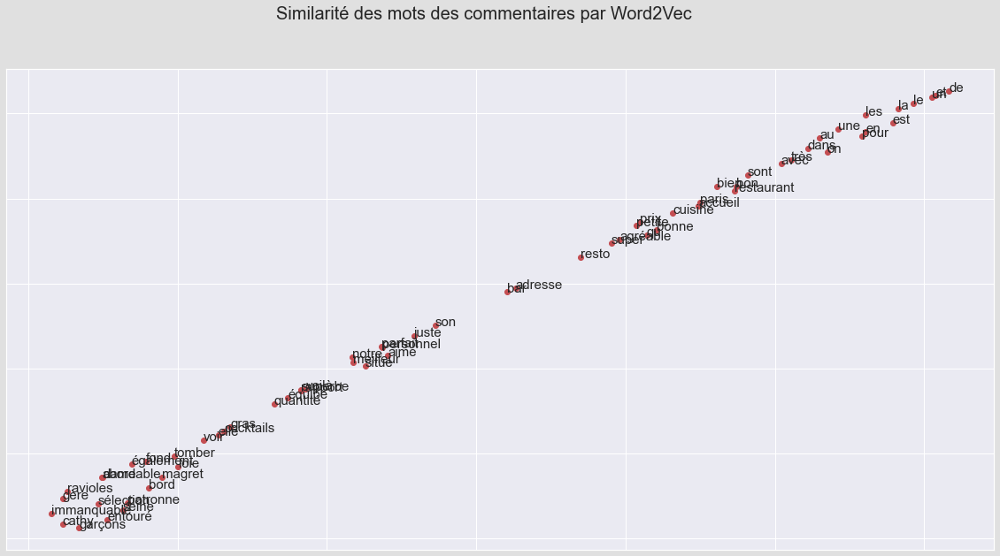

In [37]:
from sklearn.manifold import TSNE


wanted_words = []
count = 0
for word in word_vectors.vocab:
    if count < 65:
        wanted_words.append(word)
        count += 1
    else:
        break
        
wanted_vocab = dict((k, word_vectors.vocab[k])\
                    for k in wanted_words if k in word_vectors.vocab)

X = model[wanted_vocab]
tsne_model = TSNE(perplexity=20, n_components=2, init="pca",
                  n_iter=5000, random_state=23)

Y = tsne_model.fit_transform(X)

fig, ax = plt.subplots(figsize=(20,10))
fig.patch.set_facecolor('#E0E0E0')
ax.scatter(Y[:, 0], Y[:, 1], color='r')
words = list(wanted_vocab)

for i, word in enumerate(words):
    plt.annotate(word, xy=(Y[i, 0], Y[i, 1]),
                 size=15)
    
ax.set_yticklabels([])
ax.set_xticklabels([])
fig.suptitle("Similarité des mots des commentaires par Word2Vec", fontsize=20)
plt.show()

> <font color='red'>ANALYSE</font>

> <font color='red'> Des groupes de mots se forment le long d'une droite comme en bas à gauche, un groupe contenant des mots se rapportant à la nourriture **foie gras, magret, ravioles, cocktails** qui caractérisent les commentaires positifs.</font>

### Traitement du corpus contenant des commentaires avec ratings < 3

In [38]:
documents = []

for index, row in data_df_neg.iterrows():
    documents.append(read_review(row,"text_review"))
    
# Création du modèle Word2Vec    
model = gensim.models.Word2Vec(size=100, window=5,
                               min_count=1, sg=0, workers=4)
model.build_vocab(documents)

# Entrainement du modèle Word2Vec
model.train(sentences=documents,
            total_examples=len(documents),
            epochs=model.iter)

word_vectors = model.wv

count = 0
for word in word_vectors.vocab:
    if count < 20:
        print(word)
        count += 1
    else:
        break

une
étoile
pour
le
magnifique
cadre
les
petites
tables
en
marbre
et
dorures
qui
nous
emmènent
au
début
du
siècle


> Visualisation de la sémantique du corpus avec Word2Vec :

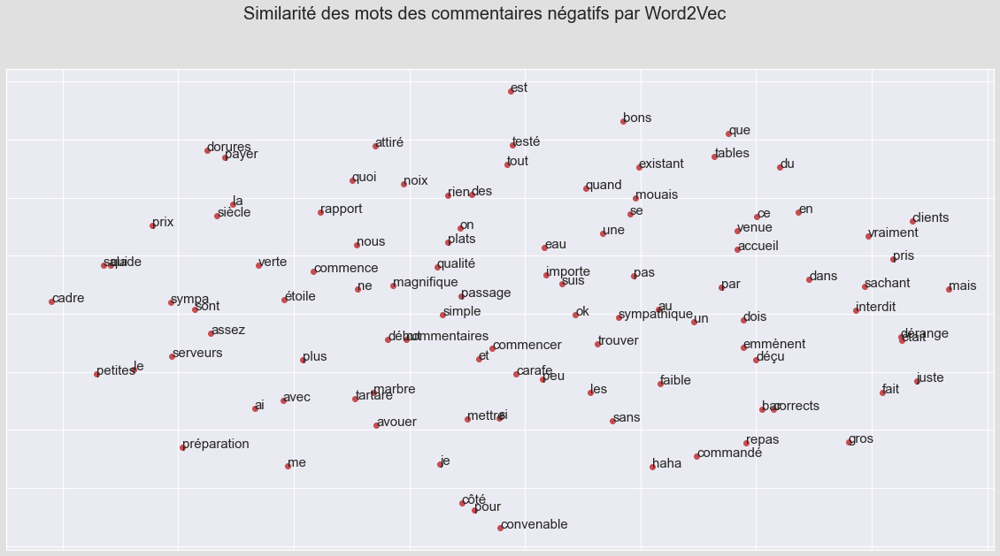

In [39]:
from sklearn.manifold import TSNE


wanted_words = []
count = 0
for word in word_vectors.vocab:
    if count < 100:
        wanted_words.append(word)
        count += 1
    else:
        break
        
wanted_vocab = dict((k, word_vectors.vocab[k])\
                    for k in wanted_words if k in word_vectors.vocab)

X = model[wanted_vocab]
tsne_model = TSNE(perplexity=20, n_components=2, init="pca",
                  n_iter=5000, random_state=23)

Y = tsne_model.fit_transform(X)

fig, ax = plt.subplots(figsize=(20,10))
fig.patch.set_facecolor('#E0E0E0')
ax.scatter(Y[:, 0], Y[:, 1], color='r')
words = list(wanted_vocab)

for i, word in enumerate(words):
    plt.annotate(word, xy=(Y[i, 0], Y[i, 1]),
                 size=15)
    
ax.set_yticklabels([])
ax.set_xticklabels([])
fig.suptitle("Similarité des mots des commentaires négatifs par Word2Vec", fontsize=20)
plt.show()

> <font color='red'>ANALYSE</font>

> <font color='red'> Pour les commentaires avec un mauvais rating, les groupes de mots sont plus dispersés. Certains mots se rapprochent tels que **qualité, prix, faible, rapport** qui caractérisent les commentaires négatifs. Parmi ces commentaires, on voit bien qu'il y a un mélange de mots à connotation positive et négative.</font>

* Visualisation t-SNE du corpus:

### Traitement du corpus contenant des commentaires avec différents ratings

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


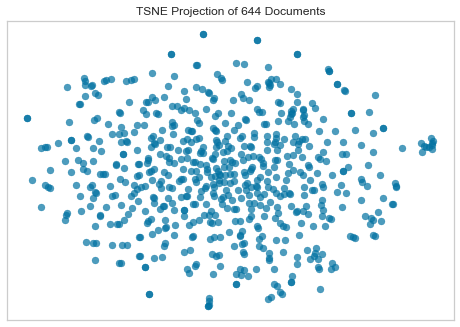

<AxesSubplot:title={'center':'TSNE Projection of 644 Documents'}>

In [40]:
from sklearn import manifold
from yellowbrick.text import TSNEVisualizer

tfidf = TfidfVectorizer(min_df=2, binary=True)

X = tfidf.fit_transform(reviews_clean)

tsne = TSNEVisualizer()
tsne.fit(X)
tsne.show()

### Traitement du corpus contenant des commentaires avec ratings < 3

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


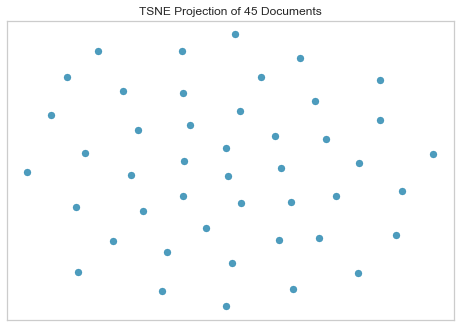

<AxesSubplot:title={'center':'TSNE Projection of 45 Documents'}>

In [41]:
from sklearn import manifold
from yellowbrick.text import TSNEVisualizer

tfidf = TfidfVectorizer(min_df=2, binary=True)

X = tfidf.fit_transform(reviews_clean_neg)

tsne = TSNEVisualizer()
tsne.fit(X)
tsne.show()

* PCA :

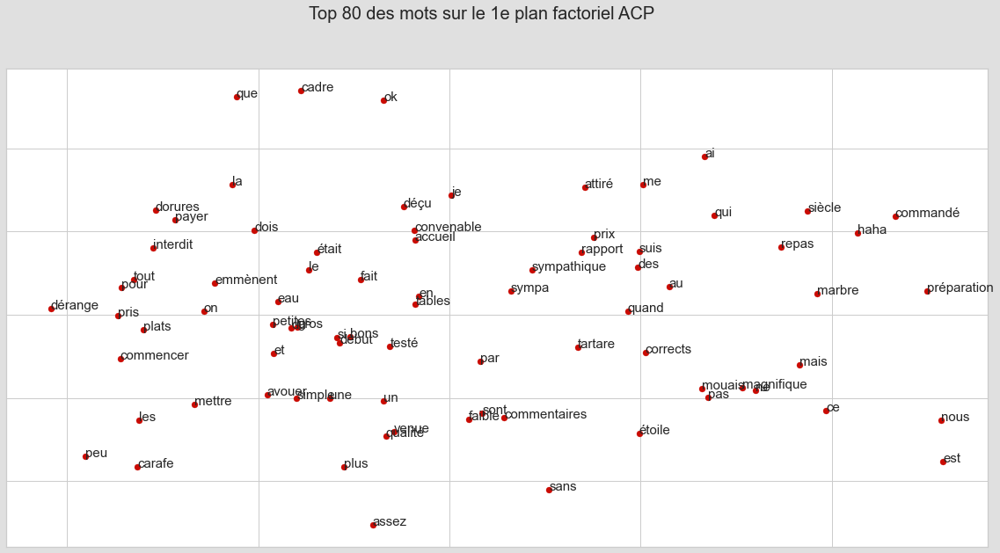

In [42]:
from sklearn.decomposition import PCA

vec = TfidfVectorizer(min_df=2, 
                      binary=True)
vec.fit(reviews_clean)
X = vec.transform(reviews_clean)
features = vec.get_feature_names()

wanted_words = []
count = 0
for word in word_vectors.vocab:
    if count < 80:
        wanted_words.append(word)
        count += 1
    else:
        break
        
wanted_vocab = dict((k, word_vectors.vocab[k])\
                    for k in wanted_words if k in word_vectors.vocab)


X = model[wanted_vocab]
pca = decomposition.PCA(n_components=3).fit(X)

Y = pca.transform(X)

def display_vec():

    fig, ax = plt.subplots(figsize=(20,10))
    fig.patch.set_facecolor('#E0E0E0')
    ax.scatter(Y[:, 0], Y[:, 1], color='r')
    words = list(wanted_vocab)

    for i, word in enumerate(words):
        plt.annotate(word, xy=(Y[i, 0], Y[i, 1]),
                     size=15)
    
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    plt.suptitle("Top {} des mots sur le 1e plan factoriel ACP"\
                  .format(count), fontsize=20)
    plt.show()

    
display_vec()

### Pour le corpus contenant des commentaires avec ratings < 3

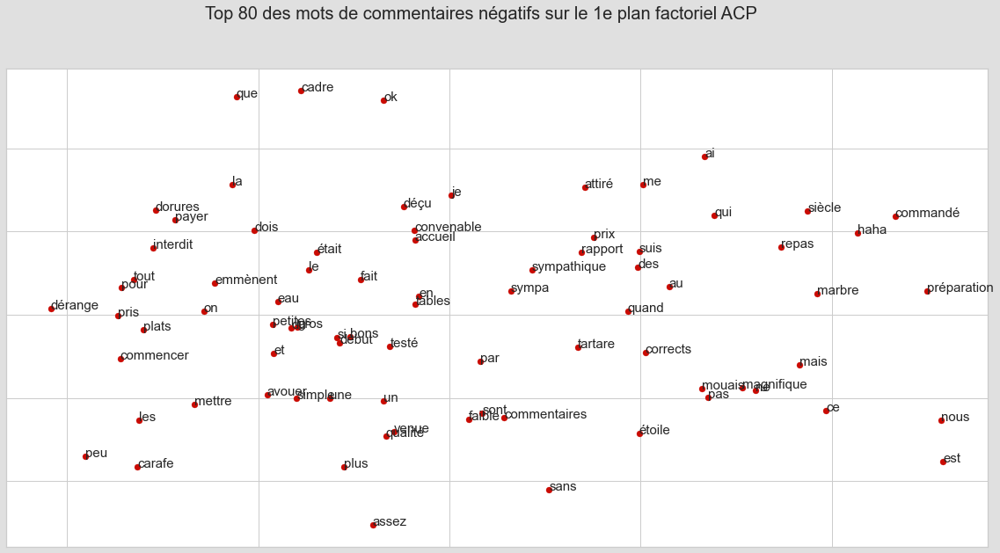

In [43]:
vec = TfidfVectorizer(min_df=2, 
                      binary=True)
vec.fit(reviews_clean_neg)
X = vec.transform(reviews_clean_neg)
features = vec.get_feature_names()

wanted_words = []
count = 0
for word in word_vectors.vocab:
    if count < 80:
        wanted_words.append(word)
        count += 1
    else:
        break
        
wanted_vocab = dict((k, word_vectors.vocab[k])\
                    for k in wanted_words if k in word_vectors.vocab)


X = model[wanted_vocab]
pca = decomposition.PCA(n_components=3).fit(X)

Y = pca.transform(X)

def display_vec():

    fig, ax = plt.subplots(figsize=(20,10))
    fig.patch.set_facecolor('#E0E0E0')
    ax.scatter(Y[:, 0], Y[:, 1], color='r')
    words = list(wanted_vocab)

    for i, word in enumerate(words):
        plt.annotate(word, xy=(Y[i, 0], Y[i, 1]),
                     size=15)
    
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    plt.suptitle("Top {} des mots de commentaires négatifs sur le 1e plan factoriel ACP"\
                  .format(count), fontsize=20)
    plt.show()

    
display_vec()

## c) Visualisation des données

* Word cloud des commentaires avec différents ratings :

> On peut voir la fréquence des mots employés dans les commentaires positifs et négatifs.

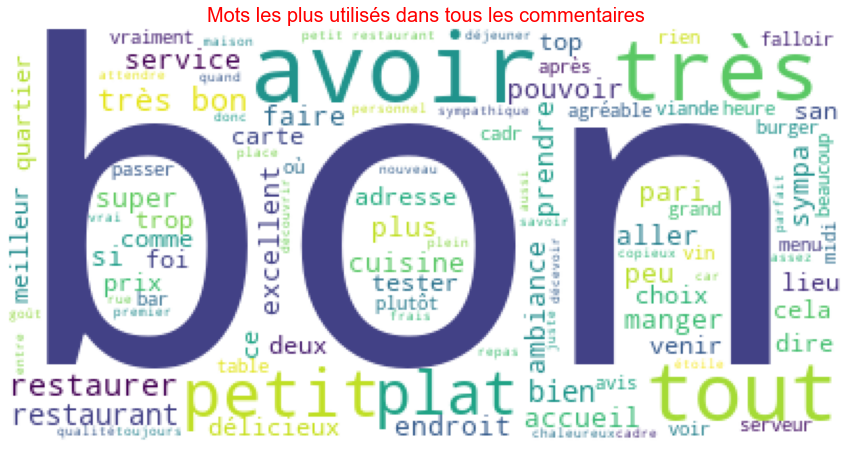

In [44]:
from wordcloud import WordCloud
from PIL import Image

cloud_all = {'text_all': []}

text = " ".join(i for i in reviews_clean)
cloud_all['text_all'].append(text)

wc_neg = WordCloud(background_color="white", max_words=100,
                   contour_width=0.5, 
                   contour_color='red', 
                   max_font_size=500)

wc_neg.generate(text)

plt.figure(figsize=(15,10))
plt.imshow(wc_neg, interpolation=None)
plt.title("Mots les plus utilisés dans tous les commentaires", fontsize=20,color='Red')
plt.axis("off")
plt.show()

In [45]:
data_cloud_all = pd.DataFrame(cloud_all)
data_cloud_all.to_csv("P6_02_cloud_all.csv", sep=',', index=False)

> Pour les commentaires avec des ratings < 3.

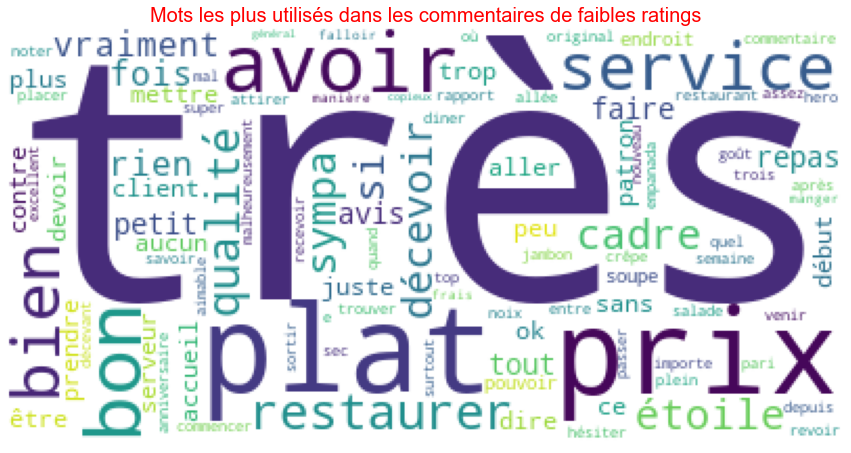

In [46]:
cloud_neg = {'text_neg': []}


text = " ".join(i for i in reviews_clean_neg)
cloud_neg['text_neg'].append(text)


wc_neg = WordCloud(background_color="white", max_words=100,
                   contour_width=0.5, 
                   contour_color='red', 
                   max_font_size=500)

wc_neg.generate(text)

plt.figure(figsize=(15,10))
plt.imshow(wc_neg, interpolation=None)
plt.title("Mots les plus utilisés dans les commentaires de faibles ratings",
          fontsize=20,
          color='Red')
plt.axis("off")
plt.show()

In [47]:
data_cloud_neg = pd.DataFrame(cloud_neg)
data_cloud_neg.to_csv("P6_02_cloud_neg.csv", sep=',', index=False)

* Topic modelling avec LDA (Latente Dirichlet Allocation) et NMF (Negative Matrix Factorisation) 

### Cas de tous les commentaires :

> Ces algorithmes permettent de trouver les distributions latentes par rapport aux variables observées à savoir les distributions de mots sur les différents thèmes, proportions de thèmes pour chaque document, proportions d’apparition d’un thème sur le corpus

> Latente Dirichlet Allocation

In [48]:
from sklearn.decomposition import LatentDirichletAllocation


tf_vectorizer = CountVectorizer(min_df=2) 
tf = tf_vectorizer.fit_transform(reviews_clean)
tf_feature_names = tf_vectorizer.get_feature_names()

n_topics = 20

lda = LatentDirichletAllocation(
        n_components=n_topics, 
        max_iter=5, 
        learning_method='online', 
        learning_offset=50.,
        random_state=0)

lda.fit(tf)

def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print("Sujet {}:".format(topic_idx))
        print(" ".join([feature_names[i] \
                        for i in topic.argsort()[:-no_top_words - 1:-1]]))

        
no_top_words = 10
display_topics(lda, tf_feature_names, no_top_words)

Sujet 0:
ok conseiller pouvoir repas passer remplir lecture tête anglais amoureux
Sujet 1:
list mode refaire temps changer attente parfait queue réservation carte
Sujet 2:
expérience attentionné souffler emmener travailler année pot sous jambon meilleur
Sujet 3:
famille décider verjus malheureusement top bon accueil service plat restaurant
Sujet 4:
mamma fond excellent tellement euro tester vien gueule jambon jean
Sujet 5:
avoir lieu heure petit paris passer ouvrir adresse ce meilleur
Sujet 6:
exigu installer priser minute étage quatre certes deuxième emplacement endroit
Sujet 7:
deux cuisine moins gens sauce bleu servir comme petit choix
Sujet 8:
celui sympa rue situer spécial porc effet mention rôtir près
Sujet 9:
omg souffler nan nickel atypique sauvage spécialisé saler véritable avant
Sujet 10:
quand terrass place possible entrer intérieur touriste encore permettre flux
Sujet 11:
tout pari restaurer plat meilleur avis restaurant petit donc premier
Sujet 12:
quitter produit falloir 

* Visualisation de la distribution des mots sur chaque sujet :

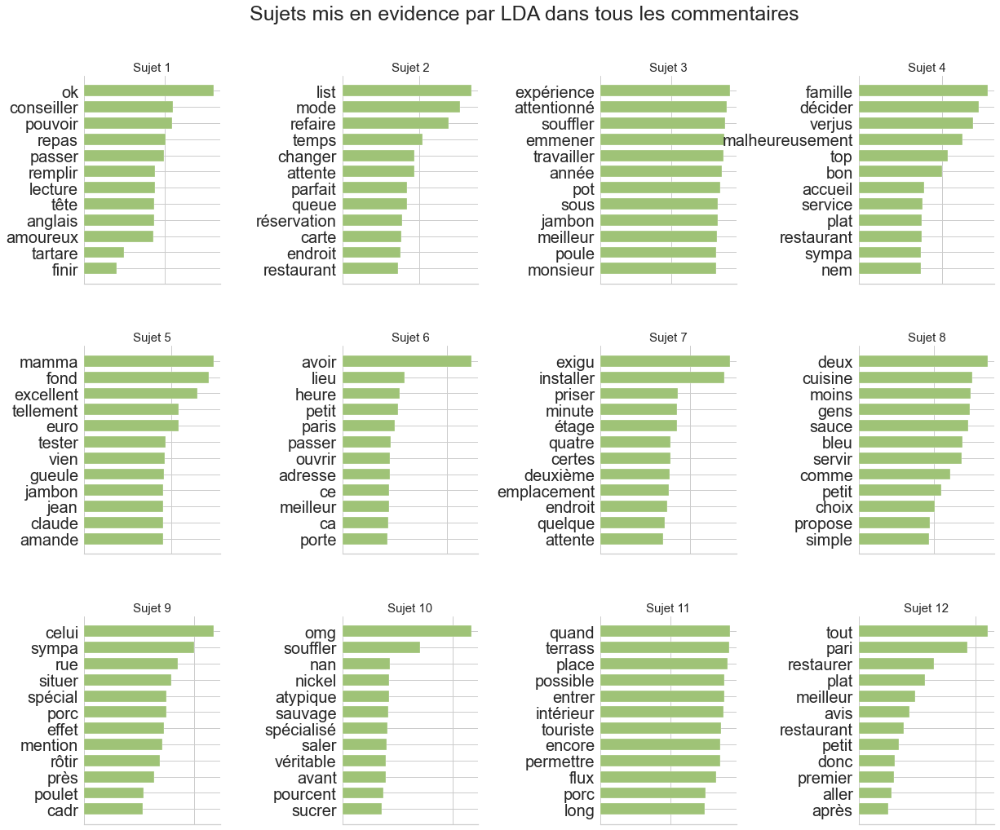

In [49]:
data_all = {'features_all': [], 'weights_all': []}


def plot_top_words(model, feature_names, n_top_words,
                   title, color):
    
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))
    axes = axes.flatten()
    for topic_idx, topic in enumerate(model.components_[:n_top_words]):
        top_features_ind = topic.argsort()[:-n_top_words - 1:-1]
        top_features = [feature_names[i] for i in top_features_ind]
        weights = topic[top_features_ind]
        for i in top_features_ind:
            data_all['features_all'].append(feature_names[i])
            data_all['weights_all'].append(topic[i])


            
        

        ax = axes[topic_idx]
        ax.barh(top_features, weights, height=0.7,
                color=color)
        ax.set_title(f'Sujet {topic_idx +1}',
                     fontdict={'fontsize': 15})
        ax.invert_yaxis()
        ax.tick_params(axis='both', which='major', labelsize=20)
        for i in 'top right left'.split():
            ax.spines[i].set_visible(False)
        fig.suptitle(title, fontsize=25)
        ax.tick_params(bottom=False)
        ax.set(xticklabels=[])

    plt.subplots_adjust(top=0.90, bottom=0.05, wspace=0.90, hspace=0.3)
    plt.show()

no_top_words = 12
plot_top_words(lda, tf_feature_names, no_top_words, 
               'Sujets mis en evidence par LDA dans tous les commentaires',
               'g')

In [50]:
data_text_all = pd.DataFrame(data_all)
data_text_all.to_csv("P6_02_text_all_LDA.csv", sep=',', index=False)

### Cas des commentaires avec faibles ratings :

In [51]:
tf_vectorizer = CountVectorizer(min_df=2) 
tf = tf_vectorizer.fit_transform(reviews_clean_neg)
tf_feature_names = tf_vectorizer.get_feature_names()

n_topics = 20

lda = LatentDirichletAllocation(
        n_components=n_topics, 
        max_iter=5, 
        learning_method='online', 
        learning_offset=50.,
        random_state=0)

lda.fit(tf)

def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print("Sujet {}:".format(topic_idx))
        print(" ".join([feature_names[i] \
                        for i in topic.argsort()[:-no_top_words - 1:-1]]))

        
no_top_words = 10
display_topics(lda, tf_feature_names, no_top_words)

Sujet 0:
mettre qualité restaurant vraiment client avoir revoir depuis avis plus
Sujet 1:
bon très cadre sympa plat qualité restaurer plus peu prix
Sujet 2:
quel juste restaurer excellent tout importe super être service repas
Sujet 3:
quand noter hésiter si étoile avis entre bien trouver qualité
Sujet 4:
commentaire revoir si endroit qualité pouvoir service mal peu pari
Sujet 5:
nourriture général prendre faire jeter accueil recevoir patron lamentable bien
Sujet 6:
prix plat si qualité repas après rapport mettre assez pouvoir
Sujet 7:
décevoir serveur week très savoir end rien si avoir vraiment
Sujet 8:
avoir étoile peu serveur devoir venir faire début sec hésiter
Sujet 9:
si patron faire aimable surtout importe falloir cela recevoir noix
Sujet 10:
très début contre soupe plat service accueil top étoile excellent
Sujet 11:
décevoir ce aller piège sortir fourchette restaurant endroit fois attirer
Sujet 12:
repas prendre prix faire accueil avoir quand piège attirer jeter
Sujet 13:
trop p

* Visualisation de la distribution des mots sur chaque sujet :

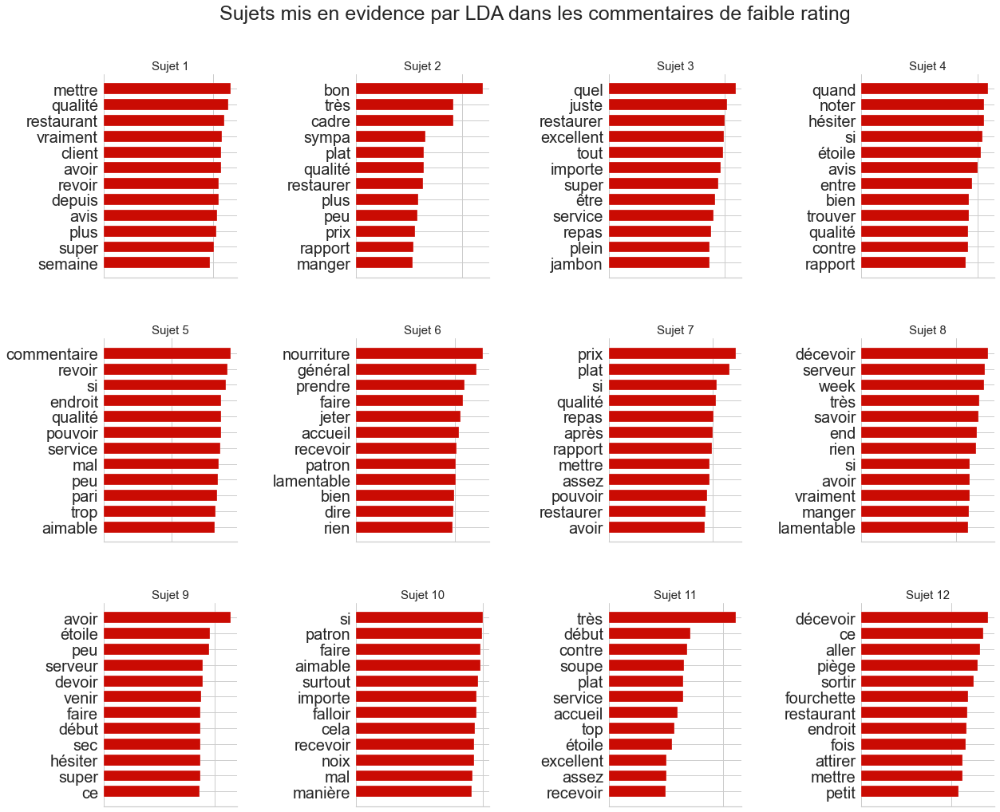

In [52]:
data_neg = {'features_neg': [], 'weights_neg': []}


def plot_top_words_neg(model, feature_names, n_top_words,
                   title, color):
    
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))
    axes = axes.flatten()
    for topic_idx, topic in enumerate(model.components_[:n_top_words]):
        top_features_ind = topic.argsort()[:-n_top_words - 1:-1]
        top_features = [feature_names[i] for i in top_features_ind]
        weights = topic[top_features_ind]
        for i in top_features_ind:
            data_neg['features_neg'].append(feature_names[i])
            data_neg['weights_neg'].append(topic[i])


        ax = axes[topic_idx]
        ax.barh(top_features, weights, height=0.7,
                color=color)
        ax.set_title(f'Sujet {topic_idx +1}',
                     fontdict={'fontsize': 15})
        ax.invert_yaxis()
        ax.tick_params(axis='both', which='major', labelsize=20)
        for i in 'top right left'.split():
            ax.spines[i].set_visible(False)
        fig.suptitle(title, fontsize=25)
        ax.tick_params(bottom=False)
        ax.set(xticklabels=[])

    plt.subplots_adjust(top=0.90, bottom=0.05, wspace=0.90, hspace=0.3)
    plt.show()


no_top_words = 12
plot_top_words_neg(lda, tf_feature_names, no_top_words, 
               'Sujets mis en evidence par LDA dans les commentaires de faible rating',
               'r')

In [53]:
data_text_neg = pd.DataFrame(data_neg)
data_text_neg.to_csv("P6_02_text_neg_LDA.csv", sep=',', index=False)

> Negative Matrix Factorisation

### Cas de tous les commentaires

In [54]:
from sklearn.decomposition import NMF

tfidf_vectorizer = TfidfVectorizer(min_df=2) 
tfidf = tfidf_vectorizer.fit_transform(reviews_clean)
tfidf_feature_names = tfidf_vectorizer.get_feature_names()

no_topics = 20
nmf = NMF(n_components=no_topics, random_state=1, alpha=.1,
          l1_ratio=.5, init='nndsvd')
nmf.fit(tfidf)

no_top_words = 10
display_topics(nmf, tfidf_feature_names, no_top_words)

Sujet 0:
bon viande sympa restaurant vin chaleureux très accueil peu carte
Sujet 1:
tout simplement prendre aller celui comme chouette serveur abord exquis
Sujet 2:
petit restaurant sympa bien quartier super mine payer cadr plutôt
Sujet 3:
plat carte servir délicieux peu vin original menu copieux souvent
Sujet 4:
cuisine accueil grand chaleureux produit sympathique pate chef sourire desservir
Sujet 5:
qualité prix rapport cadr simple contre raisonnable antan repas produit
Sujet 6:
très personnel bon agréable correct prix copieux bien bel carte
Sujet 7:
faire maison cela comme choix aller dire burger moment boulangerie
Sujet 8:
restaurer situer surprise car dire cœur grâce rapide jamais falloir
Sujet 9:
frais manger ravioli pâte lamen quantité devant nouveau client produit
Sujet 10:
trop bémol seul beaucoup prendre salle mal éclairer demi détendu
Sujet 11:
adresse ce tester après avis midi accueil yelp signet complètement
Sujet 12:
service agréable excellent rapide sympathique impeccabl

* Visualisation de la distribution des mots sur chaque sujet :

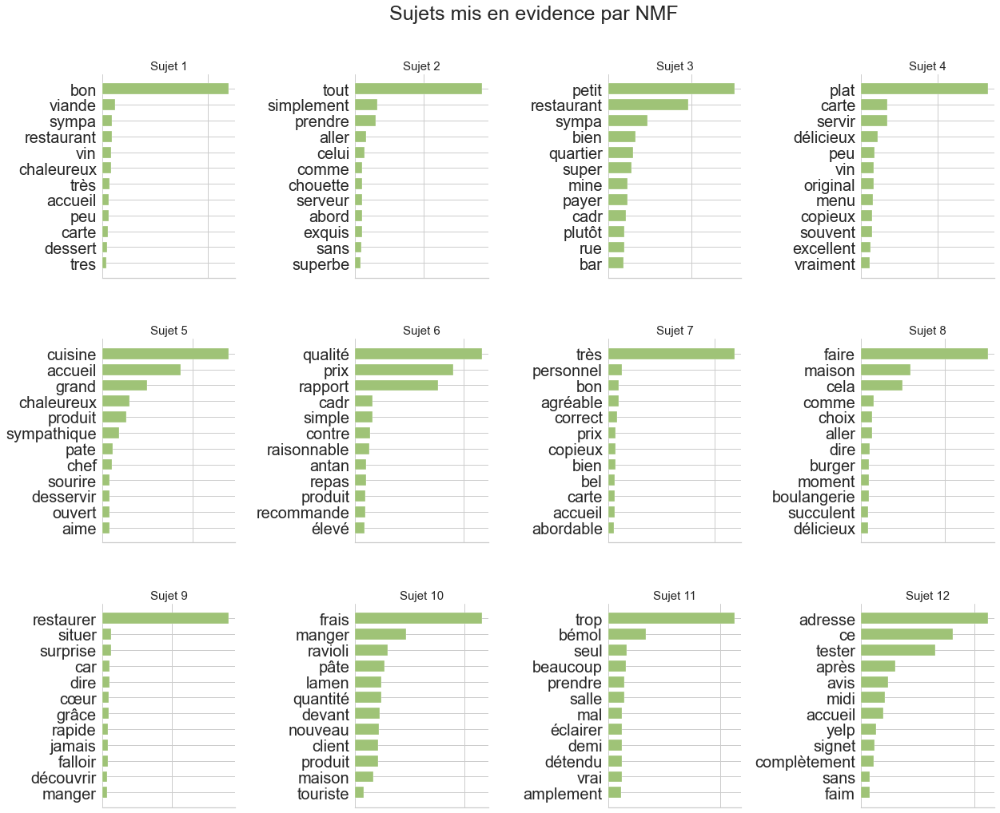

In [55]:
data_all_nmf = {'features_all_nmf': [], 'weights_all_nmf': []}

def plot_top_words_nmf(model, feature_names, n_top_words,
                   title, color):
    
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))
    axes = axes.flatten()
    for topic_idx, topic in enumerate(model.components_[:n_top_words]):
        top_features_ind = topic.argsort()[:-n_top_words - 1:-1]
        top_features = [feature_names[i] for i in top_features_ind]
        weights = topic[top_features_ind]
        for i in top_features_ind:
            data_all_nmf['features_all_nmf'].append(feature_names[i])
            data_all_nmf['weights_all_nmf'].append(topic[i])
        

        ax = axes[topic_idx]
        ax.barh(top_features, weights, height=0.7,
                color=color)
        ax.set_title(f'Sujet {topic_idx +1}',
                     fontdict={'fontsize': 15})
        ax.invert_yaxis()
        ax.tick_params(axis='both', which='major', labelsize=20)
        for i in 'top right left'.split():
            ax.spines[i].set_visible(False)
        fig.suptitle(title, fontsize=25)
        ax.tick_params(bottom=False)
        ax.set(xticklabels=[])

    plt.subplots_adjust(top=0.90, bottom=0.05, wspace=0.90, hspace=0.3)
    plt.show()

    
no_top_words = 12
plot_top_words_nmf(nmf, tfidf_feature_names, no_top_words,
               'Sujets mis en evidence par NMF', 'g')

In [56]:
data_text_all_nmf = pd.DataFrame(data_all_nmf)
data_text_all_nmf.to_csv("P6_02_text_all_NMF.csv", sep=',', index=False)

### Cas des commentaires avec faible rating :

In [57]:
tfidf_vectorizer = TfidfVectorizer(min_df=2) 
tfidf = tfidf_vectorizer.fit_transform(reviews_clean_neg)
tfidf_feature_names = tfidf_vectorizer.get_feature_names()

no_topics = 20
nmf = NMF(n_components=no_topics, random_state=1, alpha=.1,
          l1_ratio=.5, init='nndsvd')
nmf.fit(tfidf)

no_top_words = 10
display_topics(nmf, tfidf_feature_names, no_top_words)

Sujet 0:
très bon pari soupe copieux restaurer bien cadre plat endroit
Sujet 1:
revoir vraiment qualité super jambon mettre avis service plat aucun
Sujet 2:
tout placer petit juste aller depuis restaurer cadre début venir
Sujet 3:
week end décevoir général prendre cela mal savoir anniversaire vraiment
Sujet 4:
trop rien décevant sec vraiment jambon bien avoir prix qualité
Sujet 5:
rapport qualité prix contre bon pouvoir assez mettre si repas
Sujet 6:
repas quel excellent importe service quand prendre faire accueil avoir
Sujet 7:
être devoir original avoir sortir cela diner allée trois super
Sujet 8:
dire pouvoir manière client aucun restaurer nourriture jeter prendre patron
Sujet 9:
surtout falloir patron aimable mal faire jeter piège fourchette ce
Sujet 10:
peu diner sortir restaurant décevoir avis plus sans bon cadre
Sujet 11:
étoile entre hésiter avis bien noter début quand si prix
Sujet 12:
recevoir accueil lamentable général nourriture manière patron après allée endroit
Sujet 13:


* Visualisation de la distribution des mots sur chaque sujet :

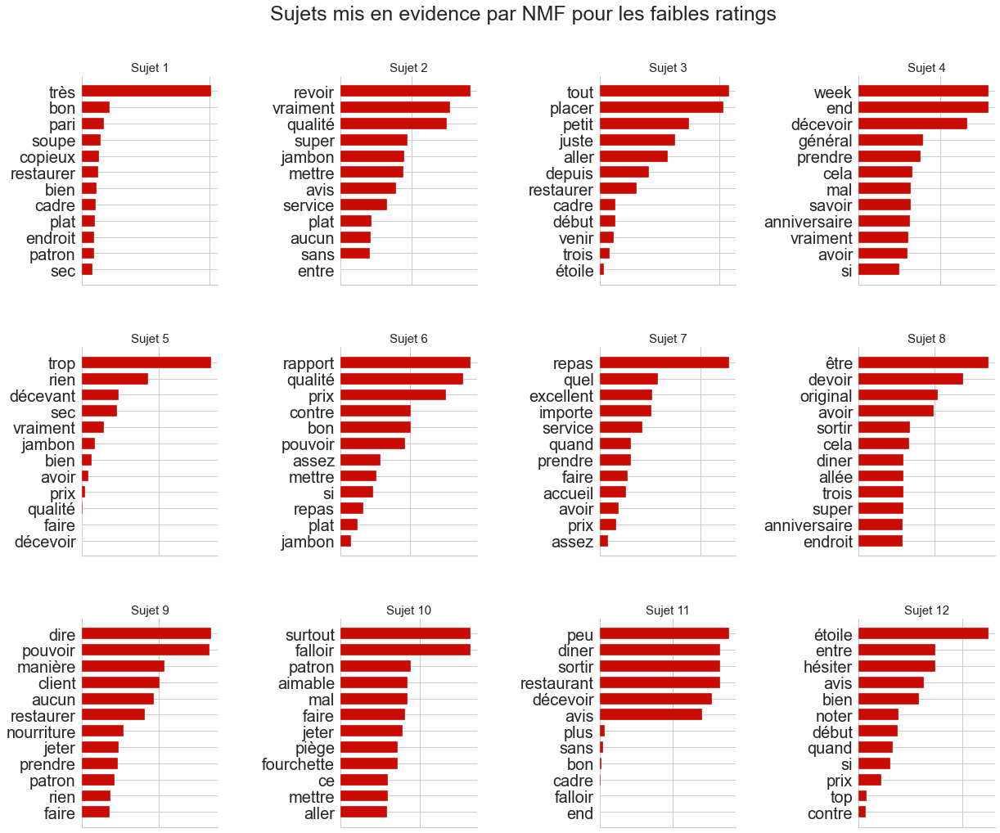

In [58]:
data_neg_nmf = {'features_neg_nmf': [], 'weights_neg_nmf': []}

def plot_top_words_neg_nmf(model, feature_names, n_top_words,
                   title, color):
    
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))
    axes = axes.flatten()
    for topic_idx, topic in enumerate(model.components_[:n_top_words]):
        top_features_ind = topic.argsort()[:-n_top_words - 1:-1]
        top_features = [feature_names[i] for i in top_features_ind]
        weights = topic[top_features_ind]
        for i in top_features_ind:
            data_neg_nmf['features_neg_nmf'].append(feature_names[i])
            data_neg_nmf['weights_neg_nmf'].append(topic[i])

            
        ax = axes[topic_idx]
        ax.barh(top_features, weights, height=0.7,
                color=color)
        ax.set_title(f'Sujet {topic_idx +1}',
                     fontdict={'fontsize': 15})
        ax.invert_yaxis()
        ax.tick_params(axis='both', which='major', labelsize=20)
        for i in 'top right left'.split():
            ax.spines[i].set_visible(False)
        fig.suptitle(title, fontsize=25)
        ax.tick_params(bottom=False)
        ax.set(xticklabels=[])

    plt.subplots_adjust(top=0.90, bottom=0.05, wspace=0.90, hspace=0.3)
    plt.show()


no_top_words = 12
plot_top_words_neg_nmf(nmf, tfidf_feature_names, no_top_words,\
               'Sujets mis en evidence par NMF pour les faibles ratings',
               'r')

In [59]:
data_text_neg_nmf = pd.DataFrame(data_neg_nmf)
data_text_neg_nmf.to_csv("P6_02_text_neg_NMF.csv", sep=',', index=False)

### Mise en évidence des mots utilisés dans les commentaires d'insatisfaction :

* A l'aide de la régression logisitque.

In [60]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split


cv = CountVectorizer(binary=False)
cv.fit(reviews_clean)
X = cv.transform(reviews_clean)

* On affecte le classe de **1** à un commentaire positif dont le rating est **>= 3** sinon **0** pour un commentaire négatif

In [61]:
target = [1 if rate >= 3 else 0 for rate in rating]

* Entrainement du modèle :

In [62]:
X_train, X_val, y_train, y_val = train_test_split(X, target,
                                                  train_size=0.75)

for c in [0.01, 0.05, 0.25, 0.5, 1]:
    
    lr = LogisticRegression(C=c, max_iter=800)
    lr.fit(X_train, y_train)
    print ("Accuracy for C=%s: %s" 
           % (c, accuracy_score(y_val, lr.predict(X_val))))

Accuracy for C=0.01: 0.9254658385093167
Accuracy for C=0.05: 0.9254658385093167
Accuracy for C=0.25: 0.9254658385093167
Accuracy for C=0.5: 0.9254658385093167
Accuracy for C=1: 0.9254658385093167


* Récupération de mots et de leur importance dans ce modèle :

In [63]:
feature_to_coef = {
    word: coef for word, coef in zip(
        cv.get_feature_names(), lr.coef_[0]
    )
}
feature_to_coef

{'abord': 0.07066256870853785,
 'abordable': 0.12697552692394115,
 'abrite': 0.0,
 'abriter': 0.0,
 'absolument': 0.18447559687765666,
 'absolut': 0.015387845995957562,
 'absolute': 0.015387845995957562,
 'abîme': 0.0,
 'ac': -0.34516779996265157,
 'accent': 0.04159807241886565,
 'accepter': 0.004828142146295193,
 'acceuil': 0.0018069779519936933,
 'acceuiller': 0.0,
 'accompagnement': -0.09934020925429349,
 'accompagner': 0.029076930587772366,
 'accord': 0.01684443854771254,
 'accorder': 0.04173094531299656,
 'accrer': 0.01824021614931806,
 'accro': 0.0,
 'accrocher': 0.055781501093605454,
 'accueil': 0.3056485912509566,
 'accueillant': 0.12472138186398593,
 'accueillir': 0.1740202535530923,
 'accès': 0.0,
 'adapte': 0.016541354933758683,
 'adapter': 0.06728809938443756,
 'addition': -0.46603401512310866,
 'addresse': 0.030684392151926233,
 'adeline': 0.01690357280663625,
 'adopte': 0.02655996966123462,
 'adorable': 0.2583583309686507,
 'adorai': 0.003382627020863441,
 'adore': 0.0891

* Pour les commentaires avec un rating >= 3 :

In [64]:
for best_positive in sorted(
    feature_to_coef.items(), 
    key=lambda x: x[1], 
    reverse=True)[:10]:
    print (best_positive)

('restaurant', 0.714041461919122)
('petit', 0.6849575286369445)
('bon', 0.5541410366789723)
('cuisine', 0.5262178310501504)
('ambiance', 0.4941738318216178)
('lieu', 0.47402805511510454)
('délicieux', 0.4630967540632491)
('produit', 0.4221001627312319)
('adresse', 0.4148867414517405)
('place', 0.38769238843232573)


* Pour les commentaires avec un rating < 3 :

In [65]:
for best_negative in sorted(
    feature_to_coef.items(), 
    key=lambda x: x[1])[:10]:
    print (best_negative)

('prix', -1.0789035554164574)
('décevoir', -0.9320069441161175)
('cadre', -0.8754591130329235)
('contre', -0.8095258291248846)
('client', -0.8039663038567372)
('desagreabl', -0.7768553337615823)
('dmg', -0.7768553337615823)
('fois', -0.7483814046167849)
('ramen', -0.6543931357619567)
('repas', -0.6532598205018461)


> <font color='red'>ANALYSE</font>

> <font color='red'> Pour les commentaires avec un mauvais rating, les mots les plus utilisés sont **décevoir, ramen, désagréable, prix, soupe** qui caractérisent souvent des plats que les clients n'ont pas aimé, ainsi que le prix qui revient souvent.</font>

# 3. Analyse des photos des restaurants


## a) Pré-traitement des données visuelles

> L'histogramme des images va être représenté et des corrections d'image telles que **l'étirement pour l'exposition ou l'égalisation pour le contraste** vont être appliquées.
> L'algorithme de **SIFT (Scale Invariant Feature Transform)** permet de détecter efficacement les features d'une image.
> Les réseaux de neuronnes **CNN (Convutionnal Neural Network)** permettent de classifier les photos.

* Chargement des images :

In [66]:
from PIL import Image, ImageOps
import requests
from io import BytesIO

photos = []
def load_img(df):

    for i in data_df.index:
        photos.append(data_df["photo_1"][i].strip())
        photos.append(data_df["photo_2"][i].strip())
        photos.append(data_df["photo_3"][i].strip())

load_img(data_df)

* Histogrammes des images originales :

Largeur : 1000 px, hauteur : 750 px
Taille de la matrice de pixels : (750, 1000, 3)


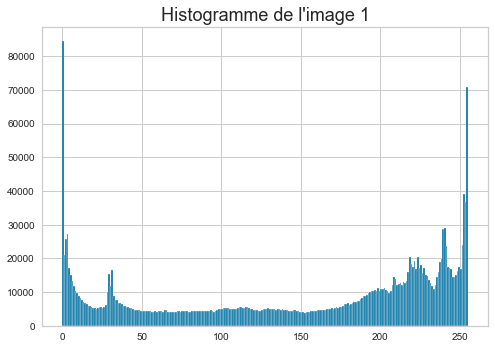

Largeur : 750 px, hauteur : 1000 px
Taille de la matrice de pixels : (1000, 750, 3)


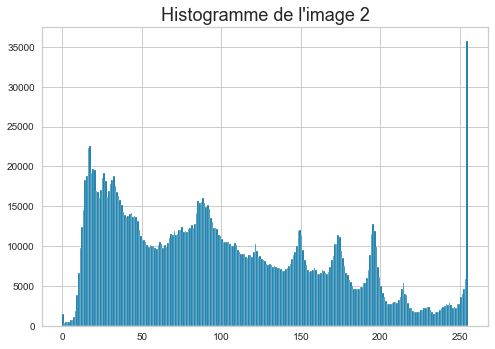

Largeur : 1000 px, hauteur : 750 px
Taille de la matrice de pixels : (750, 1000, 3)


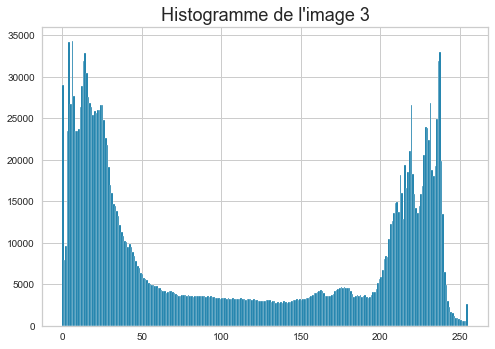

Largeur : 750 px, hauteur : 1000 px
Taille de la matrice de pixels : (1000, 750, 3)


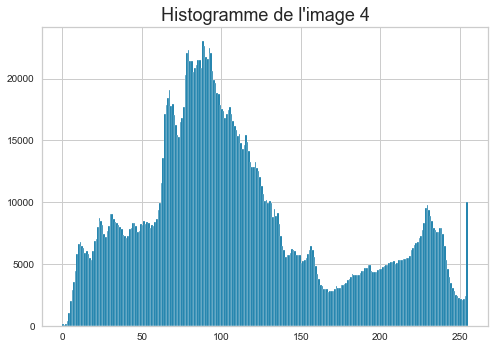

In [67]:
def display_histo(photos, nb_photos):
        i = 0
        for elt in photos[:nb_photos]:
            i += 1
            response = requests.get(elt)
            img = Image.open(BytesIO(response.content))
            mat = np.array(img)
            w, h = img.size
            print("Largeur : {} px, hauteur : {} px"\
                  .format(w, h))
            print("Taille de la matrice de pixels : {}"\
                  .format(mat.shape))
            n, bins, patches = plt.hist(mat.flatten(),
                                        bins=range(256))
            plt.title("Histogramme de l'image {}".format(i) ,
                      fontsize=18)
            img.show()
            plt.show()


display_histo(photos, 4)

> <font color='red'>ANALYSE</font>

> <font color='red'> Les images présentent des différences de luminosité entre certaines zone notamment avec la présence de pic pour certaines zones, il faut donc égaliser ces images pour corriger le contraste (méthode equalize).</font>

* Lissage (ou débruitage) par l'application d'un filtre moyenneur :

> Le bruit des images va être corrigé par l'application de filtres **(filtre moyenneur, médian, gaussien, non local means)**. Il existe différents bruits tels que le bruit gaussien ou le bruit impulsionnel.
Ici on utilise le filtre moyenneur de taille 3X3. De plus, les images vont être égalisées afin de corriger le contraste.

In [68]:
from PIL import ImageFilter
from numpy import asarray


images = []

def filter_img(img):
    img = img.filter(ImageFilter.BoxBlur(1))
    return img


def clean_cont(img):
#   img = img.convert('L')
    img = ImageOps.equalize(img)
    return img


images = []
images_1 = []
images_2 = []


for elt in photos:
    response = requests.get(elt)
    img = Image.open(BytesIO(response.content))
    img = img.resize((150, 150))
    images_2.append(asarray(img))
    img = filter_img(img)
    img = clean_cont(img)
    img = img.resize((45,45))        
    images.append(asarray(img))
    images_1.append(asarray(img).flatten())
        
img = np.array(images)
img_1 = np.array(images_1)
img_2 = np.array(images_2)

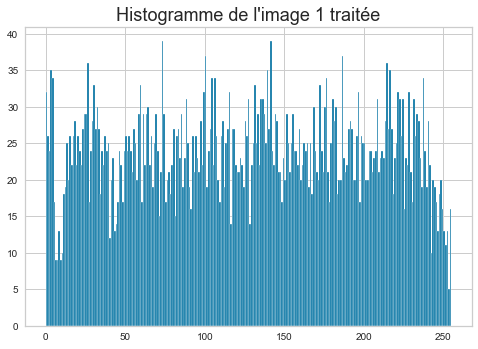

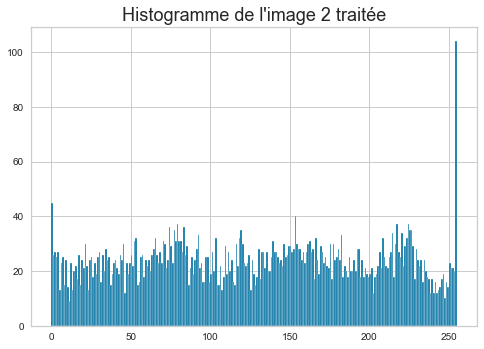

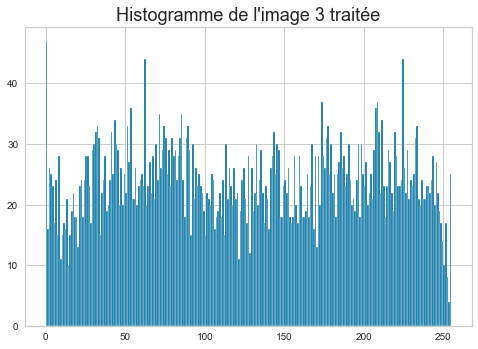

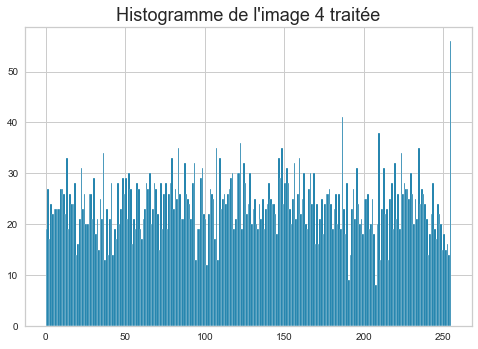

In [69]:
def display_histo_trt(image, nb_img):
        i = 0
        for elt in image[:nb_img]:
            i += 1
            n, bins, patches = plt.hist(elt.flatten(),
                                        bins=range(256))
            plt.title("Histogramme de l'image {} traitée".format(i) ,
                      fontsize=18)
            plt.show()


display_histo_trt(images_1, 4)

> <font color='red'>ANALYSE</font>

> <font color='red'> Les pixels sont répartis plus uniformément sur tous les niveaux d'intensité de l'histogramme. La luminosité des images est plus répartie.</font>

## b) Réduction de dimension et visualisation

* PCA :

In [70]:
std_scale = preprocessing.StandardScaler().fit(img_1)
X_scaled = std_scale.transform(img_1)


pca = decomposition.PCA(n_components=180).fit(X_scaled)
X_projected = pca.transform(X_scaled)

print(pca.explained_variance_ratio_.cumsum())

[0.10268214 0.17115771 0.21225103 0.25258603 0.28196521 0.31115504
 0.33870635 0.35876661 0.37697008 0.39359371 0.40907979 0.42406853
 0.43870391 0.451442   0.46314214 0.47421973 0.48435346 0.49439262
 0.50357484 0.51235763 0.52077551 0.52850401 0.53592147 0.54312539
 0.55027384 0.55674732 0.56302687 0.56923671 0.57531202 0.58115554
 0.58693977 0.59253475 0.59801253 0.60344029 0.60870465 0.61381777
 0.61873748 0.62354801 0.62823108 0.6328011  0.63727368 0.64156629
 0.64574567 0.6497583  0.6537042  0.65759921 0.66136124 0.66508141
 0.66867043 0.67223517 0.67567218 0.67908236 0.68244354 0.68565206
 0.68883434 0.69195015 0.69500183 0.69797543 0.70087624 0.70369464
 0.70650244 0.70923462 0.71189764 0.71454942 0.71713734 0.71970992
 0.72225697 0.72475551 0.72721665 0.72965645 0.73205792 0.73440541
 0.73672475 0.73900548 0.74123239 0.74343445 0.74561141 0.74775614
 0.74988998 0.75195351 0.75400211 0.75602973 0.7580544  0.76006894
 0.76205621 0.76400213 0.76590386 0.76779923 0.76966692 0.7715

> Les **16 premières composantes principales** de l' ACP expliquent plus de de 50% de la variance de notre jeu de données.

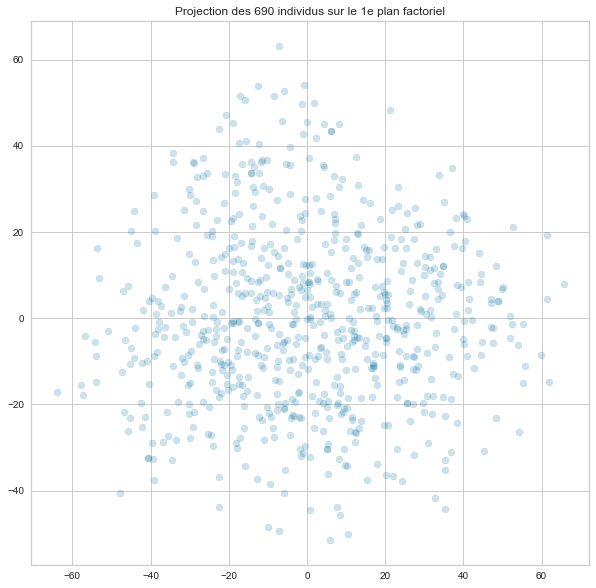

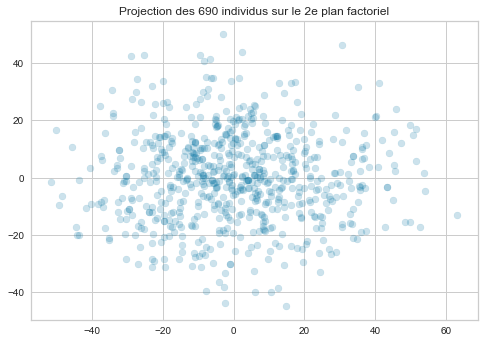

In [71]:
plt.figure(figsize=(10, 10))

for i in range(2):
    plt.scatter(X_projected[:, i], X_projected[:, i+1], 
                cmap='hsv', alpha=.2)

    plt.title("Projection des {} individus sur le {}e plan factoriel"\
              .format(X_projected.shape[0], i+1))
    plt.show()


* Visualisation t-SNE des images dans le 1er plan factoriel après une réduction par ACP :

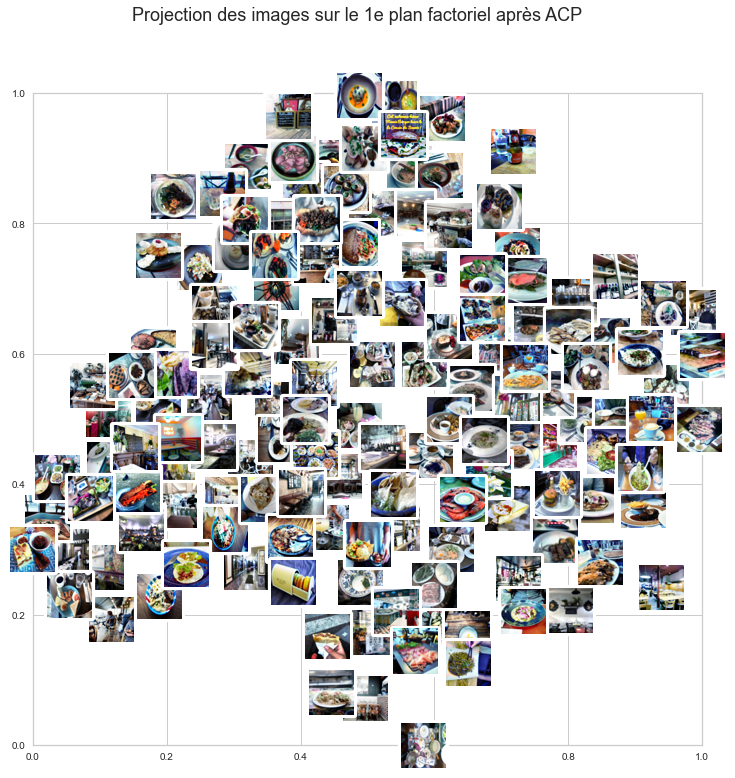

In [72]:
from matplotlib import offsetbox

# fonction pour afficher une partie des images sur la visualisation 2D
def plot_embedding(Z, title=None):
    x_min, x_max = np.min(Z, 0), np.max(Z, 0)
    X = (Z - x_min) / (x_max - x_min)

    plt.figure(figsize=(12, 12))
    ax = plt.subplot(111)

    if hasattr(offsetbox, 'AnnotationBbox'):
        shown_images = np.array([[1., 1.]])
        for i in range(X.shape[0]):
            dist = np.sum((X[i] - shown_images) ** 2, 1)
            if np.min(dist) < 2e-3:
                continue
            shown_images = np.r_[shown_images, [X[i]]]
            props={ 'boxstyle':'round', 'edgecolor':'white'}
            imagebox = offsetbox.AnnotationBbox(offsetbox\
                                                .OffsetImage(img[i],
                                                             cmap=plt.cm.gray,
                                                             zoom=1),
                                                X[i], bboxprops=props)
            ax.add_artist(imagebox)
    if title is not None:
        plt.suptitle(title, fontsize=18)

        
tsne = manifold.TSNE(n_components=2, perplexity=5, n_iter=3000, init='pca')
X_tsne = tsne.fit_transform(X_projected)
X_tsne_std = preprocessing.StandardScaler().fit_transform(X_tsne)
plot_embedding(X_tsne_std, "Projection des images sur le 1e plan factoriel après ACP")
plt.show()


> <font color='red'>ANALYSE</font>

> <font color='red'> La notion de localité et de similarité est mise en evidence par la méthode t-SNE. Notamment par la formation de groupes d'image ressemblantes telles que des soupes au somment de la visualisation, des desserts au centre, des images du décor intérieur des restaurants au centre gauche.</font>

* Visualisation t-SNE en 3D :

No handles with labels found to put in legend.


(-2.5, 2.5)

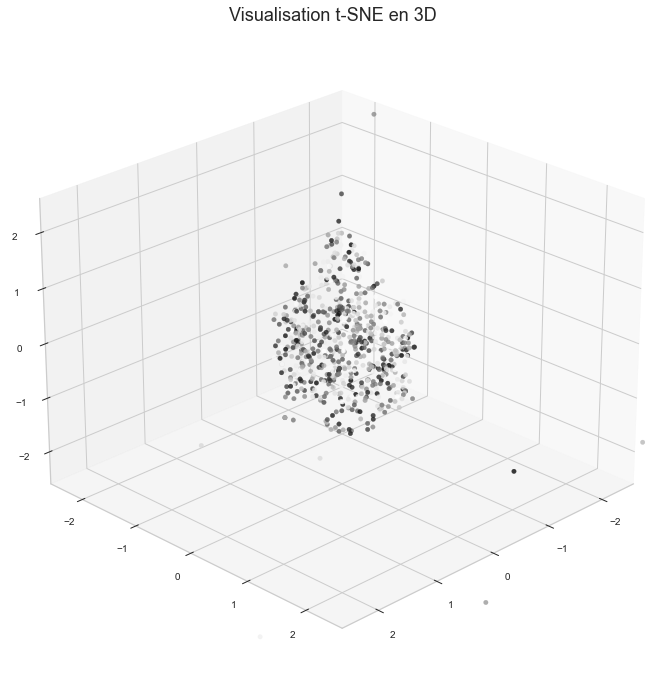

In [73]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import animation

tsne = manifold.TSNE(n_components=3, perplexity=5,
                     n_iter=3000, init='pca')
tsne_result = tsne.fit_transform(X_projected)
tsne_result_scaled = preprocessing.StandardScaler().fit_transform(tsne_result)


fig = plt.figure(figsize=(12, 12))

plt.title("Visualisation t-SNE en 3D", fontsize=18)
ax = fig.add_subplot(111, projection='3d')

plt.grid()
N = 690
colors = np.random.rand(N)    
    
ax.scatter(tsne_result_scaled[:, 0],
           tsne_result_scaled[:, 1],
           tsne_result_scaled[:, 2],
           alpha=0.8,
           c=colors,
           marker='o')
ax.set_title("Visualisation t-SNE en 3D", fontsize=18)
ax.legend(loc='best')
ax.view_init(25, 45)
ax.set_xlim(-2.5, 2.5)
ax.set_ylim(-2.5, 2.5)
ax.set_zlim(-2.5, 2.5)

## c) Labellisation automatique des images des restaurants à l'aide de **KMeans**

In [74]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import SilhouetteVisualizer


def KelbowVisualizer(X, nb_clust):

    model = KMeans()
    visualizer = KElbowVisualizer(model, k=(1, nb_clust))
    std_scale = preprocessing.StandardScaler().fit(X)
    X_scaled = std_scale.transform(X)

    visualizer.fit(X_scaled)    
    visualizer.poof()    
    
def elbow(X, k):
    
    hist = []
    std_scale = preprocessing.StandardScaler().fit(X)
    X_scaled = std_scale.transform(X)

    for kclusters in  range(1, k):
        Km = KMeans(n_jobs=-1, random_state=1,
                    n_clusters = kclusters,
                    init='k-means++').fit(X_scaled)  
        hist.append(Km.inertia_)

    plt.figure(figsize = (15, 8))
    plt.grid()
    plt.plot(range(1, k), hist, 'o-')
    plt.ylabel('Somme des distances quadratiques au centroide',
               fontsize=14)
    plt.xlabel('Nombre de clusters', fontsize=14)
    plt.title('Méthode du coude', fontsize=18)
    plt.show()


* Utilisation du **KelbowVisualizer** :

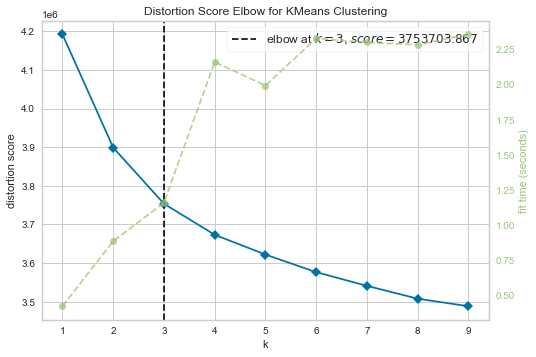

In [75]:
KelbowVisualizer(img_1, 10)

* Affichage du coefficient de silhouette pour la mesure de la performance en fonction des 3 clusters :

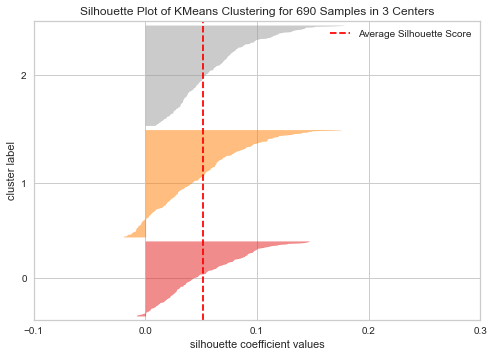

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 690 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [76]:
model = KMeans(n_clusters=3, init='random', n_init=10)
visualizer = SilhouetteVisualizer(model)

visualizer.fit(X_scaled) 
visualizer.poof()

* Utilisation de la méthode **elbow** :

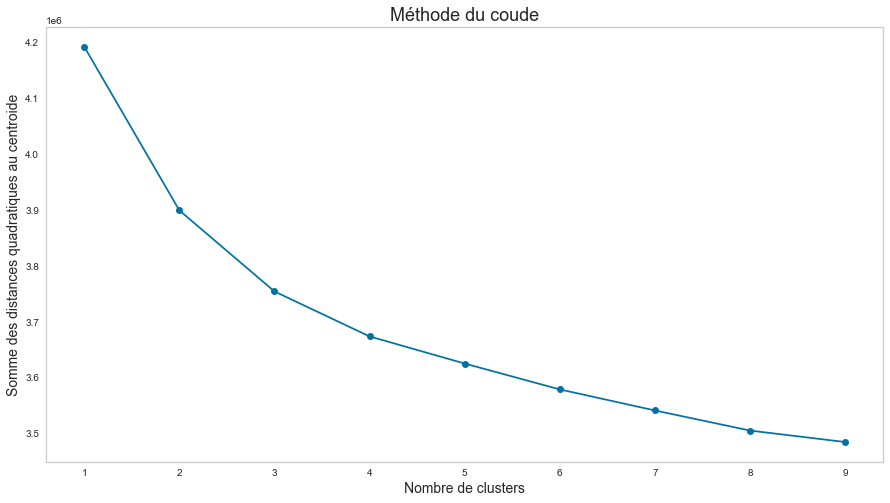

In [77]:
elbow(img_1, 10)

> <font color='red'>ANALYSE</font>

> <font color='red'>Le choix de **k=3** est justifié par un **coude** de la courbe du score de distortion.</font>

* Réduction de dimensions ACP et visualisation des données sur les 10 premiers plans factoriels :

In [78]:
std_scale = preprocessing.StandardScaler().fit(img_1)
X_scaled = std_scale.transform(img_1)


pca = decomposition.PCA(n_components=180).fit(X_scaled)
X_projected = pca.transform(X_scaled)

print(pca.explained_variance_ratio_.cumsum())

[0.10268214 0.17115771 0.21225103 0.25258603 0.28196521 0.31115504
 0.33870635 0.35876661 0.37697008 0.39359371 0.40907979 0.42406853
 0.43870391 0.451442   0.46314214 0.47421973 0.48435346 0.49439262
 0.50357484 0.51235763 0.52077551 0.52850401 0.53592147 0.54312539
 0.55027384 0.55674732 0.56302687 0.56923671 0.57531202 0.58115554
 0.58693977 0.59253475 0.59801253 0.60344029 0.60870465 0.61381777
 0.61873748 0.62354801 0.62823108 0.6328011  0.63727368 0.64156629
 0.64574567 0.6497583  0.6537042  0.65759921 0.66136124 0.66508141
 0.66867044 0.67223517 0.67567218 0.67908236 0.68244354 0.68565206
 0.68883435 0.69195016 0.69500184 0.69797544 0.70087624 0.70369464
 0.70650243 0.70923462 0.71189766 0.71454943 0.71713735 0.71970995
 0.722257   0.72475553 0.72721664 0.72965643 0.7320579  0.7344054
 0.73672474 0.73900545 0.74123238 0.74343444 0.74561141 0.7477561
 0.74988997 0.75195351 0.75400204 0.75602961 0.75805422 0.76006884
 0.76205611 0.76400205 0.76590384 0.76779939 0.76966704 0.771519

> Les **19 premières composantes principales** de l' ACP expliquent plus de de 50% de la variance de notre jeu de données.

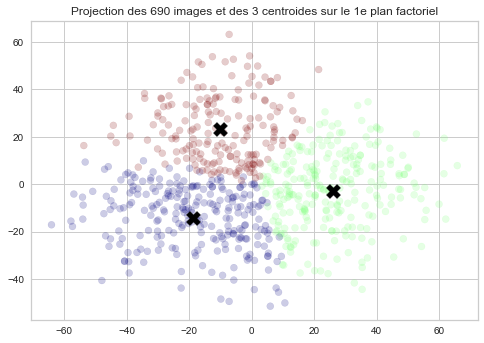

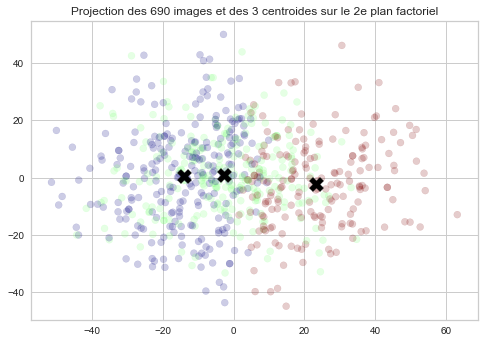

In [79]:
model.fit(X_scaled)

plt.figure()
clusters = model.labels_
label_to_id_dict = {v:i for i,v in enumerate(np.unique(clusters))}
id_to_label_dict = {v: k for k, v in label_to_id_dict.items()}

centroids = model.cluster_centers_
centroids_projected = pca.transform(centroids)

for i in range(2):
    plt.scatter(X_projected[:, i], X_projected[:, i+1], 
                c=clusters.astype(np.float),
                cmap='jet', alpha=.2,
                label=clusters)
    plt.scatter(centroids_projected[:, i], 
                centroids_projected[:, i+1],
                marker='X',
                color='black',
                alpha=1,
                s=200)

    plt.title("Projection des {} images et des 3 centroides sur le {}e plan factoriel".format(X_projected.shape[0], i+1))
    plt.show()


In [80]:
data_img_clus_2D = pd.DataFrame(X_projected)
data_img_clus_2D['cluster'] = clusters
data_img_clus_2D.to_csv("P6_02_img_clus_2D.csv", sep=',', index=False)

In [81]:
data_img_centr_2D = pd.DataFrame(centroids_projected)
data_img_centr_2D.to_csv("P6_02_img_centr_2D.csv", sep=',', index=False)

* Visualisation en 3D des clusters avec les centroides :

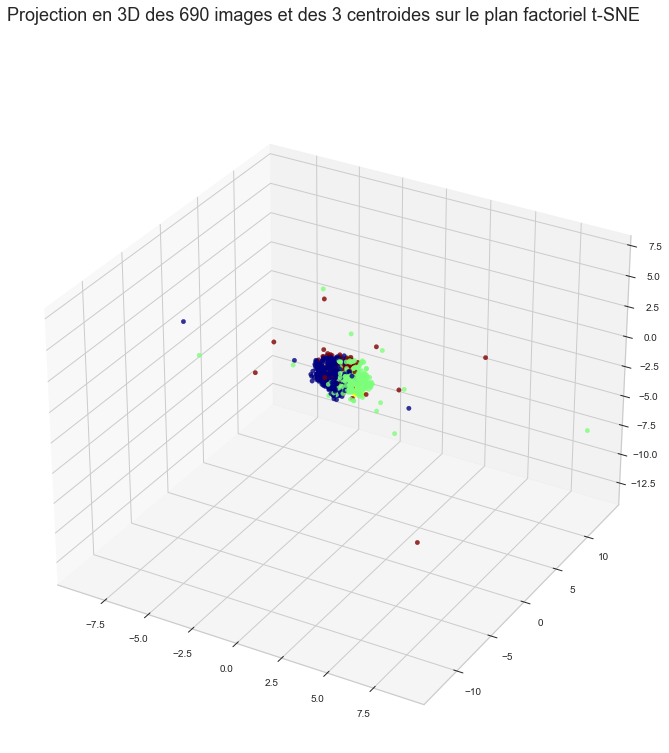

No handles with labels found to put in legend.


(-2.5, 2.5)

In [82]:
tsne = manifold.TSNE(n_components=3, perplexity=5,
                     n_iter=3000, init='pca')


tsne_result = tsne.fit_transform(X_projected)
tsne_result_scaled = preprocessing.StandardScaler()\
                                  .fit_transform(tsne_result)

tsne_res_center = tsne.fit_transform(centroids_projected)
tsne_res_scaled = preprocessing.StandardScaler()\
                               .fit_transform(tsne_res_center)

fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111, projection='3d')

plt.grid()


ax.scatter(tsne_result_scaled[:, 0],
           tsne_result_scaled[:, 1],
           tsne_result_scaled[:, 2],
           c=clusters.astype(np.float), 
           cmap='jet', alpha=.8)
ax.scatter(tsne_res_scaled[:, 0], 
           tsne_res_scaled[:, 1],
           tsne_res_scaled[:, 2],
           marker='X',
           color='yellow',
           alpha=1,
           s=200)

plt.suptitle("Projection en 3D des {} images et des 3 centroides sur le plan factoriel t-SNE"\
             .format(tsne_result_scaled.shape[0]),
             fontsize=18)
plt.show()

    
ax.legend(loc='best')
ax.view_init(20, 40)
ax.set_xlim(-2.5, 2.5)
ax.set_ylim(-2.5, 2.5)
ax.set_zlim(-2.5, 2.5)


In [83]:
data_img_clus_3D = pd.DataFrame(tsne_result_scaled)
data_img_clus_3D['cluster'] = clusters
data_img_clus_3D.to_csv("P6_02_img_clus_3D.csv", sep=',', index=False)

> <font color='red'>ANALYSE</font>

> <font color='red'>Les données images et les centroides des clusters sont concentrés.</font>

* Définition et inteprêtation des 3 clusters :

In [84]:
cluster_0 = []
cluster_1 = []
cluster_2 = []

for i in data_img_clus_2D.index:
    if data_img_clus_2D["cluster"][i] == 0:
        cluster_0.append(i)

for i in data_img_clus_2D.index:
    if data_img_clus_2D["cluster"][i] == 1:
        cluster_1.append(i)

for i in data_img_clus_2D.index:
    if data_img_clus_2D["cluster"][i] == 2:
        cluster_2.append(i)

In [85]:
def plot_clust(cluster, title):

    fig, axes = plt.subplots(3, 4, figsize=(12, 10))
    axes = axes.flatten()
    for idx, elt in enumerate(cluster[:12]):

        ax = axes[idx]
        image = img_2[elt]
        height, width, l = image.shape
        ax.axis('off')
        ax.set_title("%dx%d"%(width, height))
        ax.imshow(image)

    plt.subplots_adjust(top=0.90, bottom=0.05, wspace=0.90, hspace=0.3)
    fig.suptitle(title, fontsize=18)
    plt.show()


* Images du cluster 1 :

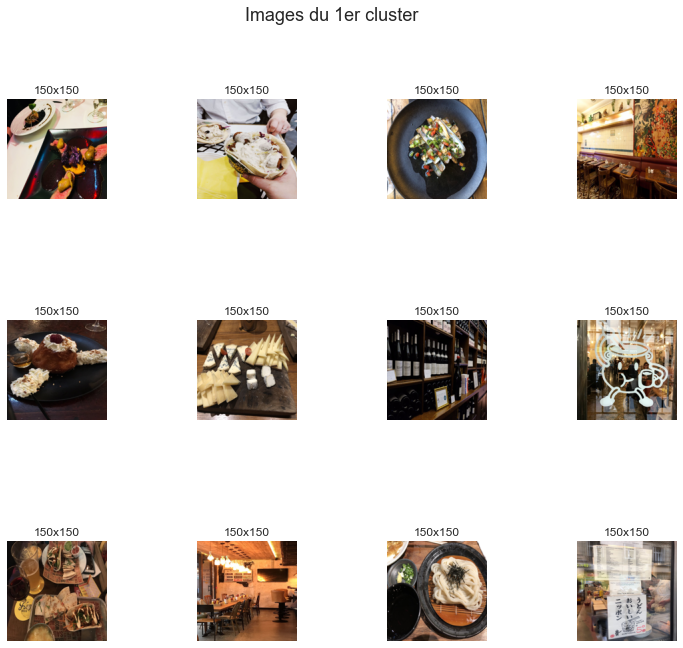

In [86]:
plot_clust(cluster_0, "Images du 1er cluster")

* Images du cluster 2:

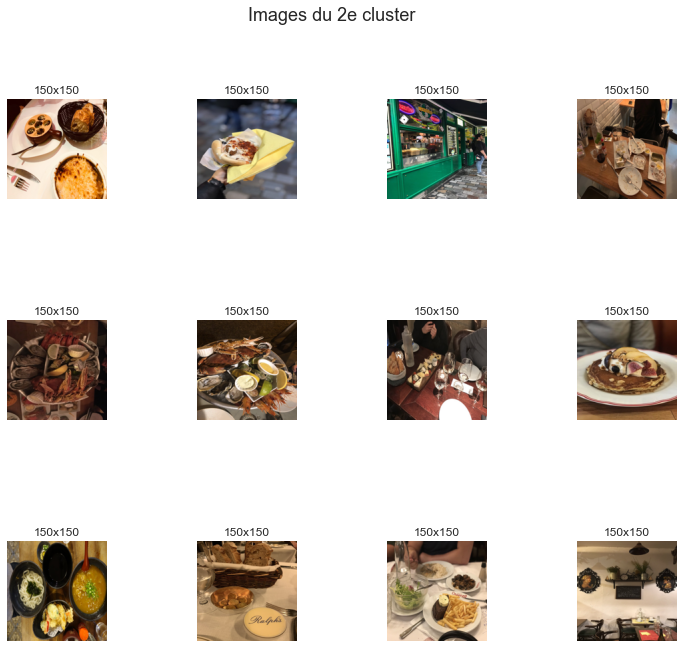

In [87]:
plot_clust(cluster_1, "Images du 2e cluster")

* Images du cluster 3:

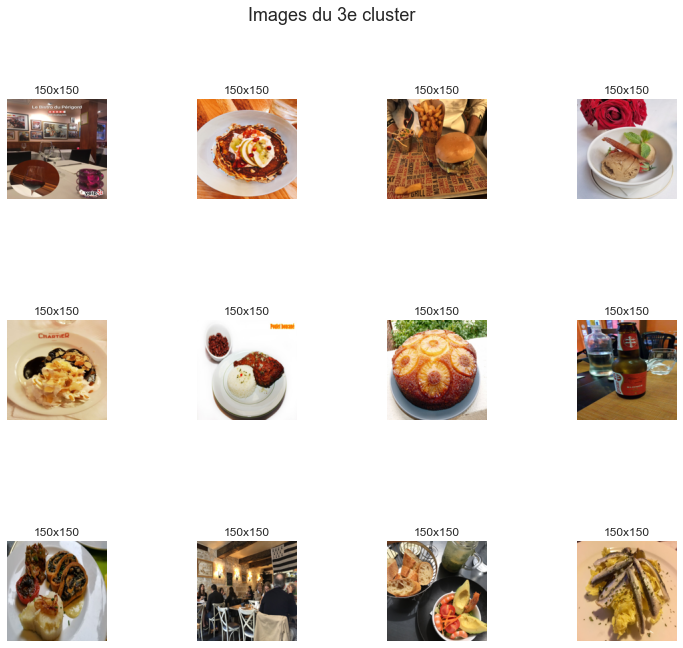

In [88]:
plot_clust(cluster_2, "Images du 3e cluster")

> <font color='red'>ANALYSE</font>

> <font color='red'> Chaque cluster regroupe des images avec des caractéristiques prédominante. Le cluster 1 regroupe en majorité des images du décor intérieur, Le cluster 2 regroupe en majorité des images d’aliments de forme circulaire et des assiettes qui présentent la même forme, Le cluster 3 regroupe en majorité des images contenant des objets en grand nombre (bouteilles, assiettes).</font>

## d) Labellisation des images par **CNN (Convolutional Neural Network)**

In [139]:
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import decode_predictions
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.applications.vgg16 import preprocess_input


model = VGG16()

In [140]:
def vgg16_predict(mdl, image, nb_img):
    
    for elt in image[:nb_img]:
        print(elt)
        response = requests.get(elt)
        img_cnn = Image.open(BytesIO(response.content))
        img_cnn.save('new_img.jpg')
        img_cnn = load_img('new_img.jpg', target_size=(224, 224))
        img_cnn = img_to_array(img_cnn)
        img_cnn = img_cnn.reshape((1, img_cnn.shape[0],
                                   img_cnn.shape[1],
                                   img_cnn.shape[2]))
        img_cnn = preprocess_input(img_cnn)
        y = mdl.predict(img_cnn)
        print('Top  :', decode_predictions(y, top=1)[0])

vgg16_predict(model, photos, 9)

https://s3-media4.fl.yelpcdn.com/bphoto/rOSDujQ3Oy4pts4FiVpe7Q/o.jpg
Top  : [('n07579787', 'plate', 0.37213847)]
https://s3-media4.fl.yelpcdn.com/bphoto/fx9KZYvaSlgy6wcLLgv_pg/o.jpg
Top  : [('n04081281', 'restaurant', 0.46872258)]
https://s3-media1.fl.yelpcdn.com/bphoto/HlcoYNqgA0zFC-SJE_TZRg/o.jpg
Top  : [('n07614500', 'ice_cream', 0.39523062)]
https://s3-media3.fl.yelpcdn.com/bphoto/QMNELSZ6-LzA9kLP3zQPgw/o.jpg
Top  : [('n07880968', 'burrito', 0.3019268)]
https://s3-media1.fl.yelpcdn.com/bphoto/xtLO-XECAC91V5ewNjLmbQ/o.jpg
Top  : [('n03089624', 'confectionery', 0.41541666)]
https://s3-media4.fl.yelpcdn.com/bphoto/xIxo5aY5-vpmnfSXUYQBUg/o.jpg
Top  : [('n07880968', 'burrito', 0.92848074)]
https://s3-media2.fl.yelpcdn.com/bphoto/B7JaBq2XmN_ZVOtKP3z65Q/o.jpg
Top  : [('n03467068', 'guillotine', 0.23836504)]
https://s3-media2.fl.yelpcdn.com/bphoto/bSDHm20h0LiN0PYq-aY25g/o.jpg
Top  : [('n01978287', 'Dungeness_crab', 0.43525946)]
https://s3-media2.fl.yelpcdn.com/bphoto/BAGVuET7YcR85A78nQm33g

* Transfert learning :

In [188]:
from tensorflow.keras.layers import Dense

model = VGG16(weights="imagenet", include_top=True, input_shape=(224, 224, 3))

model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

> Extraction de features. On n'entraine pas les poids sur toutes les couches donc on conserve ces poids obtenus par le modèle **VGG16** sur la base **ImageNet**.

In [189]:
for layers in (model.layers):
    print(layers)
    layers.trainable = False

> Création d'une couche dense pour détecter les 3 classes **(nourriture et décor intérieur, plats ou vaisselle, restaurant extérieur)** 

In [190]:
from tensorflow.keras.models import Model
from tensorflow.keras import optimizers

X= model.layers[-2].output
predictions = Dense(3, activation="softmax")(X)
model_final = Model(inputs=model.input, outputs=predictions)


model_final.compile(loss="categorical_crossentropy",
                  optimizer=optimizers.SGD(lr=0.0001, momentum=0.9),
                  metrics=["accuracy"])

model_final.summary()

Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0   

In [191]:
cluster_cnn_0 = []
cluster_cnn_1 = []
cluster_cnn_2 = []



def vgg16_predict_new(mdl, image, nb_img):
    i = 0
    for elt in image[:nb_img]:
        response = requests.get(elt)
        img_cnn = Image.open(BytesIO(response.content))
        img_cnn.save('new_img.jpg')
        img_cnn = load_img('new_img.jpg', target_size=(224, 224))
        img_cnn = img_to_array(img_cnn)
        img_cnn = img_cnn.reshape((1, img_cnn.shape[0],
                                   img_cnn.shape[1],
                                   img_cnn.shape[2]))
        img_cnn = preprocess_input(img_cnn)
        y = mdl.predict(img_cnn)
        if (y[0][0] > y[0][1] and y[0][0] > y[0][2]):
            cluster_cnn_0.append(i)
        if (y[0][1] > y[0][0] and y[0][1] > y[0][2]):
            cluster_cnn_1.append(i)
        if (y[0][2] > y[0][0] and y[0][2] > y[0][1]):
            cluster_cnn_2.append(i)
        i += 1

       

vgg16_predict_new(model_final, photos, 200)

* Images de la classe 1:

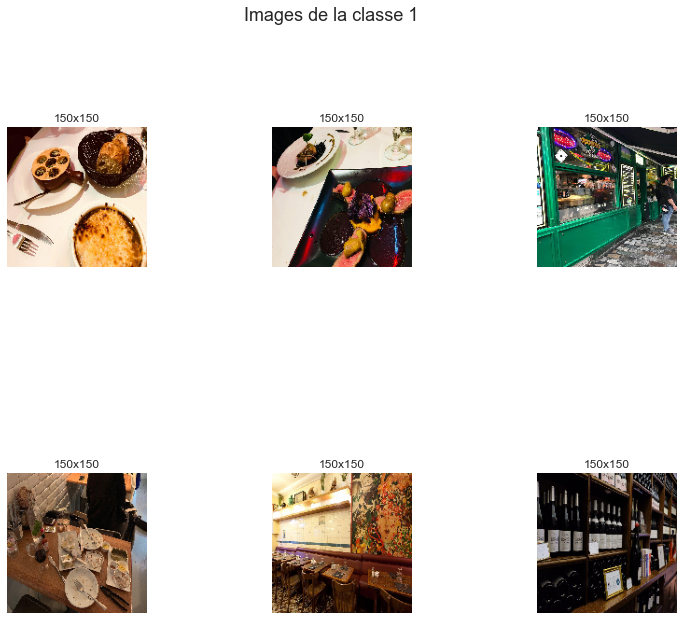

In [192]:
def plot_clust_cnn(cluster, title):

    fig, axes = plt.subplots(2, 3, figsize=(12, 10))
    axes = axes.flatten()
    for idx, elt in enumerate(cluster[:6]):

        ax = axes[idx]
        image = photos[elt]
        response = requests.get(image)
        img_cnn = Image.open(BytesIO(response.content))
        img_cnn.save('new_img.jpg')
        img_cnn = load_img('new_img.jpg', target_size=(150, 150))
        img_cnn = np.asarray(img_cnn)
        height, width, l = img_cnn.shape
        ax.axis('off')
        ax.set_title("%dx%d"%(width, height))
        ax.imshow(img_cnn)

    plt.subplots_adjust(top=0.90, bottom=0.05, wspace=0.90, hspace=0.3)
    fig.suptitle(title, fontsize=18)
    plt.show()

plot_clust_cnn(cluster_cnn_0, "Images de la classe 1")

* Images de la classe 2:

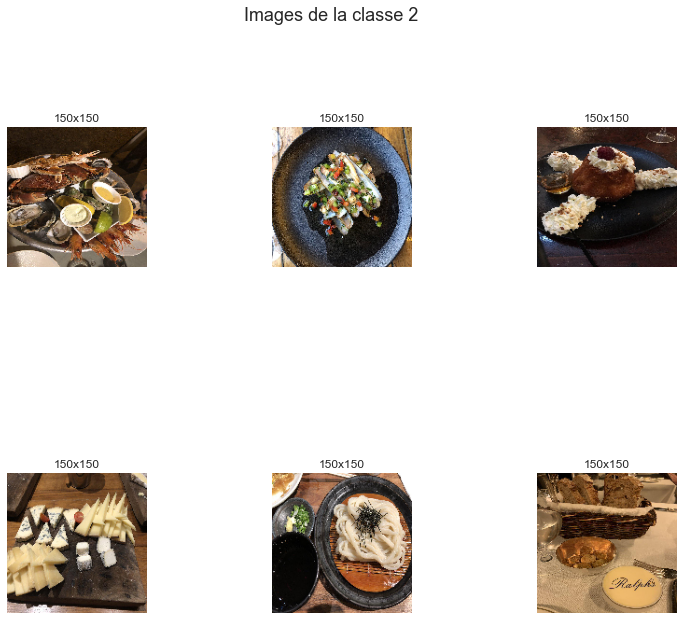

In [193]:
plot_clust_cnn(cluster_cnn_1, "Images de la classe 2")

* Images de la classe 3:

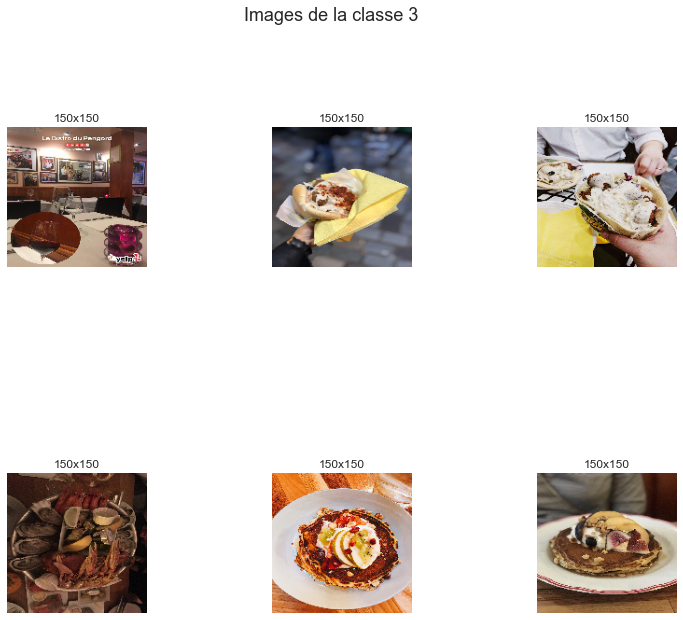

In [194]:
plot_clust_cnn(cluster_cnn_2, "Images de la classe 3")

> <font color='red'>ANALYSE</font>

> <font color='red'>L' architecture **Vgg16** prend en entrée une image 224x224 et la classe dans une des 1000 classes. Ce modèle de CNN est pré-entrainé sur la base d'images **ImageNet**. On a supprimé la couche dense de 1000 classes afin de créer une autre couche dense à 3 classes. On observe les 3 catégories **décor intérieur, plats proposés par les restaurants, plats ou aliments circulaires**)</font>